# CESM1 Test Code

S3 and S4 simulations are both a present day climate (warm). S3 is a control run of year 2000 with aerosols set to 1850 levels. S4 is a year 2000 control run with year 2000 aerosol levels.


Intro to abstract:

context research question and methods:

The goal of this study is to determine the dependence of aerosol indirect effects on the background climate. One of the largest areas of uncertainty in understanding the overall climate system is the anthropogenic aerosol forcing and in particular, aerosol indirect effects. If we can understand the aerosol indirect effects better, this could help constrain the overall uncertainty of the climate sensitivity over the historical period. In this study, we have broken down the radiative, microphysical, thermodynamical, and dynamical changes from a set aerosol perturbation in a present day and pre industrial climate in order to better understand the effects the background climate has on microphysical cloud changes. 

In [1]:
import xarray as xr
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np
import xarray.ufuncs as xrf
from scipy import stats

from os import listdir

In [2]:
from uncertainty_3d import *

In [3]:
from uncertainty_2d import *

ModuleNotFoundError: No module named 'uncertainty_2d'

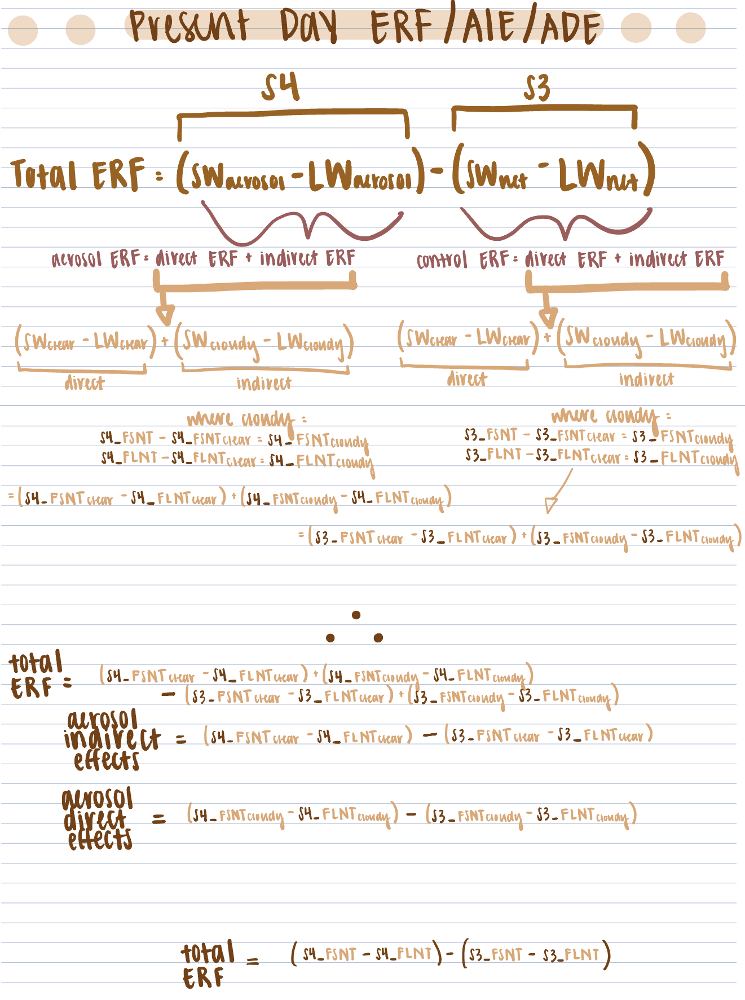

Ill be looking at 4 variables for each simulation:
- FLNT = Net Longwave TOA all sky (positive upward)
- FSNT = Net Shortwave TOA all sky (positive downward)
- FLNTC = Net Longwave TOA clear sky (positive upward)
- FSNTC = Net Shortwave TOA clear sky (positive downward)


## S3: F_2000_CAM5_1850aero

In [374]:
S3_flnt = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/FLNT.F_2000_CAM5_1850aero.mon.001-60.nc')
S3_fsnt = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/FSNT.F_2000_CAM5_1850aero.mon.001-60.nc')
S3_FLNTclear = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/FLNTC.F_2000_CAM5_1850aero.mon.001-60.nc')
S3_FSNTclear = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/FSNTC.F_2000_CAM5_1850aero.mon.001-60.nc')                     

In [375]:
# S3_flnt.FLNT.units

In [376]:
# S3_flnt.time[467]

## S4: F_2000_CAM5_good

In [377]:
S4_flnt = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/FLNT.F_2000_CAM5_good.mon.001-60.nc')
S4_fsnt = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/FSNT.F_2000_CAM5_good.mon.001-60.nc')
S4_FLNTclear = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/FLNTC.F_2000_CAM5_good.mon.001-60.nc')
S4_FSNTclear = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/FSNTC.F_2000_CAM5_good.mon.001-60.nc')                     

## Total ERF

In [378]:
coslat = np.cos(np.deg2rad(S3_flnt.FLNT.lat))
weight = coslat/coslat.mean(dim='lat')

In [379]:
S4_FSNTcloudy = (S4_fsnt.FSNT.isel(time=slice(467,720)).mean('time', keep_attrs=True)
                 - S4_FSNTclear.FSNTC.isel(time=slice(467,720)).mean('time', keep_attrs=True))
S4_FLNTcloudy = (S4_flnt.FLNT.isel(time=slice(467,720)).mean('time', keep_attrs=True)
                 - S4_FLNTclear.FLNTC.isel(time=slice(467,720)).mean('time', keep_attrs=True))

In [380]:
S3_FSNTcloudy = (S3_fsnt.FSNT.isel(time=slice(467,720)).mean('time', keep_attrs=True)
                 - S3_FSNTclear.FSNTC.isel(time=slice(467,720)).mean('time', keep_attrs=True))
S3_FLNTcloudy = (S3_flnt.FLNT.isel(time=slice(467,720)).mean('time', keep_attrs=True)
                 - S3_FLNTclear.FLNTC.isel(time=slice(467,720)).mean('time', keep_attrs=True))

In [381]:
# S3_FSNTcloudy

In [382]:
#Create a variable containing the difference in Indirect and Direct forcing


S4_direct_ERF = ((S4_FSNTclear.FSNTC.isel(time=slice(467,720)).mean('time', keep_attrs=True))
            - (S4_FLNTclear.FLNTC.isel(time=slice(467,720)).mean('time', keep_attrs=True)))

S4_indirect_ERF = (S4_FSNTcloudy - S4_FLNTcloudy)

S3_direct_ERF = ((S3_FSNTclear.FSNTC.isel(time=slice(467,720)).mean('time', keep_attrs=True))
            - (S3_FLNTclear.FLNTC.isel(time=slice(467,720)).mean('time', keep_attrs=True)))

S3_indirect_ERF = (S3_FSNTcloudy - S3_FLNTcloudy)



S4_ERF = S4_direct_ERF + S4_indirect_ERF

S3_ERF = S3_direct_ERF + S3_indirect_ERF

#Create a variable containing the weighted global average of the difference in Indirect/Direct forcing
mean_ERF_diff = (S4_ERF*weight).mean(dim='lat').mean(dim='lon') - (S3_ERF*weight).mean(dim='lat').mean(dim='lon')

print('The effective radiative forcing calculated from the combination of the indirect and direct radiative forcing is ' + 
      '{:.2f}'.format(mean_ERF_diff.values),'W/m2')

The effective radiative forcing calculated from the combination of the indirect and direct radiative forcing is -1.27 W/m2


## Splitting up direct and indirect aerosol forcings:

### Direct forcing:
aka clear sky

In [383]:
#Create a variable containing the Direct forcing
direct_ERF = S4_direct_ERF - S3_direct_ERF

#Create a variable containing the weighted global average of the difference in Indirect/Direct forcing
mean_direct_ERF = (direct_ERF*weight).mean(dim='lat').mean(dim='lon')

print('The direct radiative forcing calculated from the difference in incoming SW and outgoing LW radiation in a clear sky is ' + 
      '{:.2f}'.format(mean_direct_ERF.values),'W/m2')

The direct radiative forcing calculated from the difference in incoming SW and outgoing LW radiation in a clear sky is -0.17 W/m2


### Indirect forcing:
aka cloudy sky

In [384]:
#Create a variable containing the indirect forcing
indirect_ERF = S4_indirect_ERF - S3_indirect_ERF

#Create a variable containing the weighted global average of the difference in Indirect/Direct forcing
mean_indirect_ERF = (indirect_ERF*weight).mean(dim='lat').mean(dim='lon')

print('The indirect radiative forcing calculated from the difference in incoming SW and outgoing LW radiation in a cloudy sky is ' + 
      '{:.2f}'.format(mean_indirect_ERF.values),'W/m2')

The indirect radiative forcing calculated from the difference in incoming SW and outgoing LW radiation in a cloudy sky is -1.10 W/m2


#### And just to make sure, it should equal my all sky calculations:

In [385]:
#Create a variable containing the indirect forcing
all_ERF = (((S4_fsnt.FSNT.isel(time=slice(467,720)).mean('time', keep_attrs=True))
            - (S4_flnt.FLNT.isel(time=slice(467,720)).mean('time', keep_attrs=True)))
           - ((S3_fsnt.FSNT.isel(time=slice(467,720)).mean('time', keep_attrs=True))
              - S3_flnt.FLNT.isel(time=slice(467,720)).mean('time', keep_attrs=True)))

#Create a variable containing the weighted global average of the difference in Indirect/Direct forcing
mean_all_ERF = (all_ERF*weight).mean(dim='lat').mean(dim='lon')

print('The radiative forcing calculated from the difference in is ' + 
      '{:.2f}'.format(mean_all_ERF.values),'W/m2')

The radiative forcing calculated from the difference in is -1.27 W/m2


## What does this mean?

I have a decrease in effective radiative forcing with an input of aerosols in a present day climate...
- My ERF: -1.27 W/m2
    - Direct: -0.17 W/m2
    - Indirect: -1.10 W/m2

The IPCC AR6 values:
- ERF: -1.1 ish (-1.7 - -0.4) W/m2
    - Direct: -0.3 +/- 0.3 W/m2
    - Indirect: -1.0 +/- 0.7 W/m2

## But, I do need to split this up into thermodynamical or dynamical processes

Within the pathway of aerosols ---> clouds, there are many things that could be causing the cloud changes besides aerosol indirect/direct effects. They could be:
1) __direct radiative effects__
2) __microphysical cloud changes__ 
    - cloud droplet concentration number, CCN, liquid water path etc.
3) __thermodynamical changes__
    - How the direct effects of the aerosols are changing the vertical structure of the atmosphere
    - could change things like stability, energy available for convection, surface fluxes (sensible and latent heat flux)
4) __dynamical changes__
    - large, global scale changes like an ITCZ shift

So generally, all of these pathways can change my cloud fraction, Nd, and L, so then I have to figure out which one of these or the combinaiton of what is making the clouds. 
- cloud response -- no aerosols
    - fairly certian this is a dynamical response
- cloud response -- aerosol response
    - this could be any combination of these pathways
    - look at other variables to do a process of elimination:
        - if its thermodynamical, we would expect to see a signature in the atmospheric stability
        - if it is microphysical, maybe we see a signature in the cloud condensation nuclei? This is different because this is how many aerosols are available to become cloud droplets, not just how many droplets are in the cloud (Nd). If we see CCN and Nd in the same place, then we can assume this is probably microphysical process.
        
Putting these all together and forming a storyline could be the hard part after I plot it all.
- As I get my new data, ill also want to split up the vertical disctibution of all of this. to pinpoint different regions where my strong indirect effects are and basically draw a box and expand that vertically to see whats happening where. 

# 1. Direct Radiative Effects: ----------------------------------------------

### Map of Clear-Sky (Direct), Cloudy-Sky (Indirect), and All-Sky Change in Radiation:

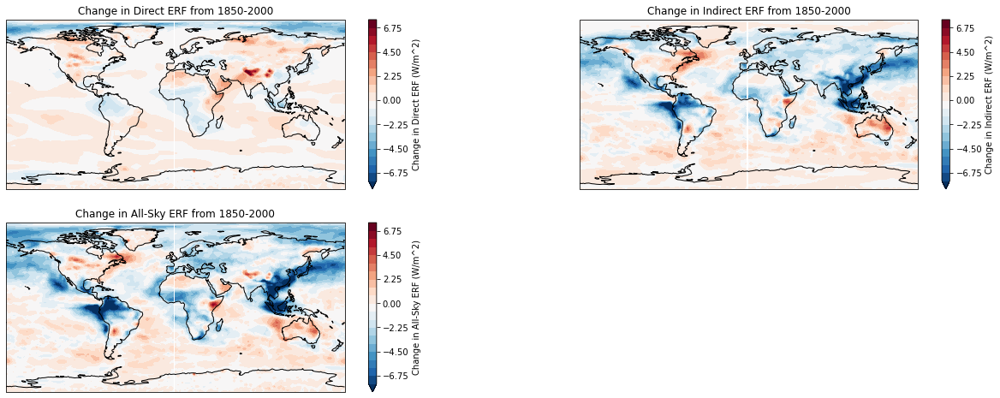

In [386]:
fig = plt.figure(figsize=[22,8])
ax = fig.add_subplot(221,projection=ccrs.PlateCarree())
direct_ERF.plot.contourf(ax=ax,levels=np.linspace(-7.5,7.5,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Change in Direct ERF (W/m^2)'})
ax.coastlines()
ax.set_title('Change in Direct ERF from 1850-2000')

ax2 = fig.add_subplot(222,projection=ccrs.PlateCarree())
indirect_ERF.plot.contourf(ax=ax2,levels=np.linspace(-7.5,7.5,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Change in Indirect ERF (W/m^2)'})
ax2.coastlines()
ax2.set_title('Change in Indirect ERF from 1850-2000')

ax3 = fig.add_subplot(223,projection=ccrs.PlateCarree())
all_ERF.plot.contourf(ax=ax3,levels=np.linspace(-7.5,7.5,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Change in All-Sky ERF (W/m^2)'})
ax3.coastlines()
ax3.set_title('Change in All-Sky ERF from 1850-2000')

plt.show();

It looks like the spatial patterns of the direct and indirect changes line up pretty well.

While there is a net, global mean, direct radiative forcing change of -0.17, there are several areas that have an increased direct radiative forcing and a decreased direct radiative forcing. There is a decrease in direct radiative forcing in the North Pole and trpoics. A decrease in the direct radiative forcing means that there is less scatttering of light through aerosol radiative interactions which could mean theres less aerosols in these areas? Where there is an increase of the direct radiative forcing, this means there is more aerosol radiative interactions and there is more scattering of light. 

More longwave??

While there is a net change in indirect radiative forcing change of -1.27 W/m^2, there is more of a decrease throughout the historical period in the tropics? This could mean less aerosols which would mean less cloud formation due to the decreased amount of CCN. In the midlatitudes and south pole, there is an increase in the indirect forcing which means there is an increase in cloud formation from aerosol CCN?

Does my aerosol perturbation line up with these locations? Do the effects look like the cloud spatial patterns?

In a present day climate, there are stronger negative radiative impacts from aerosols than in a pre industrial climate.

### Maps of Net SW and NET LW radiation:

In [387]:
FSNTcloudy_diff = (S4_FSNTcloudy - S3_FSNTcloudy)

FSNTclear_diff = (S4_FSNTclear.FSNTC.isel(time=slice(467,720)).mean('time', keep_attrs=True)
              - S3_FSNTclear.FSNTC.isel(time=slice(467,720)).mean('time', keep_attrs=True))

FLNTcloudy_diff = (S4_FLNTcloudy - S3_FLNTcloudy)

FLNTclear_diff = (S4_FLNTclear.FLNTC.isel(time=slice(467,720)).mean('time', keep_attrs=True)
              - S3_FLNTclear.FLNTC.isel(time=slice(467,720)).mean('time', keep_attrs=True))

total_flnt = (S4_flnt.FLNT.isel(time=slice(467,720)).mean('time', keep_attrs=True)
              - S3_flnt.FLNT.isel(time=slice(467,720)).mean('time', keep_attrs=True))
total_fsnt = (S4_fsnt.FSNT.isel(time=slice(467,720)).mean('time', keep_attrs=True)
              - S3_fsnt.FSNT.isel(time=slice(467,720)).mean('time', keep_attrs=True))

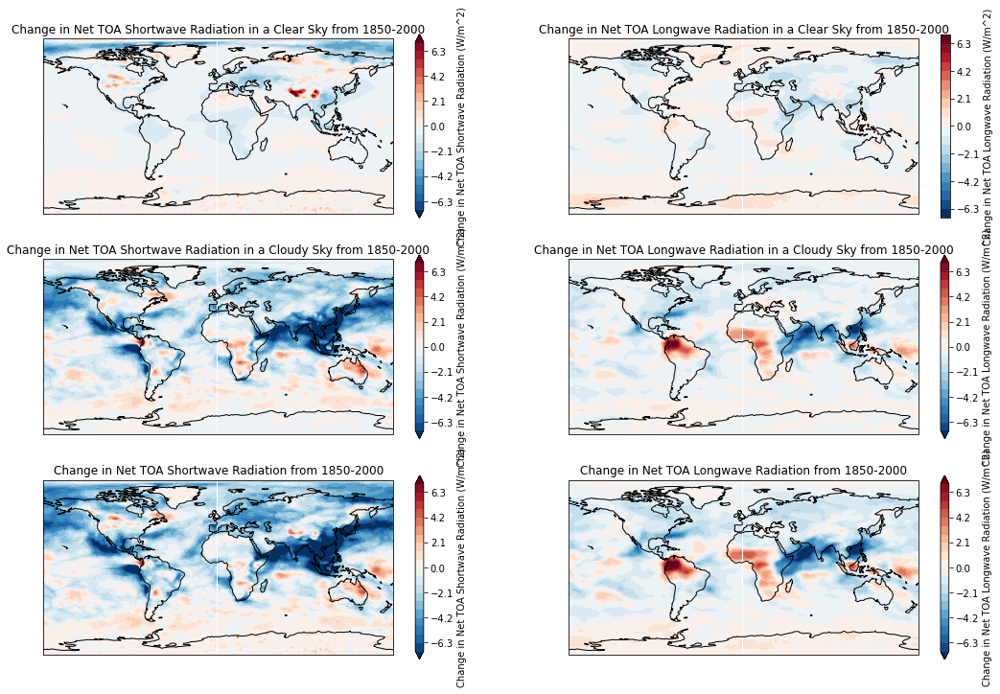

In [388]:
fig = plt.figure(figsize=[18,12])
ax = fig.add_subplot(321,projection=ccrs.PlateCarree())
FSNTclear_diff.plot.contourf(ax=ax,levels=np.linspace(-7,7,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Change in Net TOA Shortwave Radiation (W/m^2)'})
ax.coastlines()
ax.set_title('Change in Net TOA Shortwave Radiation in a Clear Sky from 1850-2000')

ax2 = fig.add_subplot(322,projection=ccrs.PlateCarree())
FLNTclear_diff.plot.contourf(ax=ax2,levels=np.linspace(-7,7,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Change in Net TOA Longwave Radiation (W/m^2)'})
ax2.coastlines()
ax2.set_title('Change in Net TOA Longwave Radiation in a Clear Sky from 1850-2000')

ax3 = fig.add_subplot(323,projection=ccrs.PlateCarree())
FSNTcloudy_diff.plot.contourf(ax=ax3,levels=np.linspace(-7,7,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Change in Net TOA Shortwave Radiation (W/m^2)'})
ax3.coastlines()
ax3.set_title('Change in Net TOA Shortwave Radiation in a Cloudy Sky from 1850-2000')

ax4 = fig.add_subplot(324,projection=ccrs.PlateCarree())
FLNTcloudy_diff.plot.contourf(ax=ax4,levels=np.linspace(-7,7,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Change in Net TOA Longwave Radiation (W/m^2)'})
ax4.coastlines()
ax4.set_title('Change in Net TOA Longwave Radiation in a Cloudy Sky from 1850-2000')

ax5 = fig.add_subplot(325,projection=ccrs.PlateCarree())
total_fsnt.plot.contourf(ax=ax5,levels=np.linspace(-7,7,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Change in Net TOA Shortwave Radiation (W/m^2)'})
ax5.coastlines()
ax5.set_title('Change in Net TOA Shortwave Radiation from 1850-2000')

ax6 = fig.add_subplot(326,projection=ccrs.PlateCarree())
total_flnt.plot.contourf(ax=ax6,levels=np.linspace(-7,7,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Change in Net TOA Longwave Radiation (W/m^2)'})
ax6.coastlines()
ax6.set_title('Change in Net TOA Longwave Radiation from 1850-2000')

#Tell python to render the plot
plt.show();

What the heck do these mean...
How can there be a change in SW component if there is the same SW input into the climate form the sun?
The change in longwave is in the same areas in the clear sky and cloudy sky, it is just more exaggerated in the cloudy sky

#### The reflective component of these:

### Is the LWCF and the SWCF the same as the previous plots? (LWCF and SWCF)

In [389]:
S3_LWCF = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/LWCF.F_2000_CAM5_1850aero.mon.001-60.nc')
S4_LWCF = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/LWCF.F_2000_CAM5_good.mon.001-60.nc')

S3_SWCF = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/SWCF.F_2000_CAM5_1850aero.mon.001-60.nc')
S4_SWCF = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/SWCF.F_2000_CAM5_good.mon.001-60.nc')


In [390]:
S4_LWCF.LWCF

<xarray.DataArray 'LWCF' (time: 720, lat: 96, lon: 144)>
[9953280 values with dtype=float32]
Coordinates:
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lon      (lon) float64 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
  * time     (time) object 0001-02-01 00:00:00 ... 0061-01-01 00:00:00
Attributes:
    Sampling_Sequence:  rad_lwsw
    units:              W/m2
    long_name:          Longwave cloud forcing
    cell_methods:       time: mean

In [391]:
LWCF_diff = (S4_LWCF.LWCF.isel(time=slice(467,720)).mean('time', keep_attrs=True)
              - S3_LWCF.LWCF.isel(time=slice(467,720)).mean('time', keep_attrs=True))
SWCF_diff = (S4_SWCF.SWCF.isel(time=slice(467,720)).mean('time', keep_attrs=True)
              - S3_SWCF.SWCF.isel(time=slice(467,720)).mean('time', keep_attrs=True))

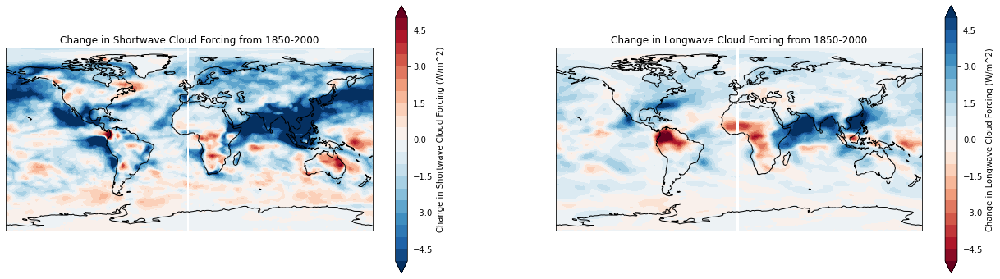

In [392]:
fig = plt.figure(figsize=[22,6])

ax = fig.add_subplot(121,projection=ccrs.PlateCarree())
SWCF_diff.plot.contourf(ax=ax,levels=np.linspace(-5,5,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Change in Shortwave Cloud Forcing (W/m^2)'})
ax.coastlines()
ax.set_title('Change in Shortwave Cloud Forcing from 1850-2000')

ax2 = fig.add_subplot(122,projection=ccrs.PlateCarree())
LWCF_diff.plot.contourf(ax=ax2,levels=np.linspace(-5,5,21),cmap='RdBu',\
                                                                      cbar_kwargs={'label':'Change in Longwave Cloud Forcing (W/m^2)'})
ax2.coastlines()
ax2.set_title('Change in Longwave Cloud Forcing from 1850-2000')

plt.show();

Switched the color bar for the longwave since it is positive upward, there must have been something going on with the negatives and positives but now it looks right. 

# 2. Microphysical Changes ----------------------------------------------

## Spatial Distribution:

- Maps of clear sky vs all sky radiation
- Maps of the cloud change
- Maps of net SW and LW, but also the reflective component of these. Incoming SW will be the same so the net is going to be showing me the change in the reflective.
- Low, middle high cloud changes to see where the indirect change is coming from
- Do the cloud changes coincide with the indirect forcing changes?
- Liquid water path (TGCLDLIWP)
- Cloud dropelt number concentration (CDNUMC)
- Cloud fraction (CLOUD)

I need:
- *__CLDTOT__ (Vertically integrated total cloud)
- *__CDNUMC__ (Vertically integrated droplet concentration)
- __CLDLIQ__ (Grid-box averaged cloud liquid amount)
- *__CLDLOW__ (Vertically integrated low cloud) 
- *__CLDMED__ (Vertically integrated mid-level cloud)
- *__CLDHGH__ (Verticlaly integrated high level cloud)
- __CLOUD__(cloud fraction)
- __NUMLIQ__(Grid-box averaged cloud liquid number)
- Theres a shortwave and longwave cloud forcing
    - __LWCF__ (longwave cloud forcing)
    - __SWCF__ (Shortwave cloud forcing)
- __TGCLDCWP__ (Total grid-box cloud water path(liquid and ice))
- __TGCLDIWP__ (Total grid-box cloud ice water path)
- *__TGCLDLWP__ (Total grid-box cloud liquid water path)

### Map of the Cloud Change (CLDTOT):

I see a similarity in some of the cloud patterns and the indirect ERF map. In the Northern part of South America, there is a decrease in total clouds which would lead to a decrease in the indirect effects. But globally, there seens to be an increase in clouds in msot areas so im a little confused as to why we are seeing increases in clouds in areas where there are decreases in indirect ERF. Lets look into more below...

### Map of Low, Middle, and High Cloud Changes (CLDLOW, CLDMED, CLDHGH):
Do these coincide with the indirect changes?

In [526]:
S3_CLDLOW = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/CLDLOW.F_2000_CAM5_1850aero.mon.001-60.nc')
S4_CLDLOW = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/CLDLOW.F_2000_CAM5_good.mon.001-60.nc')

S3_CLDMED = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/CLDMED.F_2000_CAM5_1850aero.mon.001-60.nc')
S4_CLDMED = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/CLDMED.F_2000_CAM5_good.mon.001-60.nc')

S3_CLDHGH = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/CLDHGH.F_2000_CAM5_1850aero.mon.001-60.nc')
S4_CLDHGH = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/CLDHGH.F_2000_CAM5_good.mon.001-60.nc')

S3_CLDTOT = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/CLDTOT.F_2000_CAM5_1850aero.mon.001-60.nc')
S4_CLDTOT = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/CLDTOT.F_2000_CAM5_good.mon.001-60.nc')

In [394]:
# S3_CLDLOW.CLDLOW

## Statistical Analysis and Uncertainty Code (CLDLOW)

In [395]:
# Load datasets for XAER and ALL
# all_paths, xaer_paths = tmin_paths()

# Maybe we want to select a particluar time period, say 1960-1989. We use the slice() function to include multiple years within a range
s4_cldlow_ds = S4_CLDLOW.CLDLOW.isel(time=slice(467,720))
s3_cldlow_ds = S3_CLDLOW.CLDLOW.isel(time=slice(467,720))

In [396]:
# Unfortunately, xarray is a bit too slow for running the t-test point by point, so we will need to
# do some data manipulation to achieve this in a reasonable amount of time. If I find a better way
# to do it, then I'll let you know. But for now, we need to convert to numpy, do the test, and then
# convert back to xarray.

from scipy.stats import ttest_ind # this is the function for computing the Welch's t-test

# Here we convert from xarray to numpy, losing most attributes and features but increasing performance
s4_array = s4_cldlow_ds.values
s3_array = s3_cldlow_ds.values

def welch_t_test(s4_pt, s3_pt, lat, lon):
    # Confirmed that Sarah's modified t test is just a welches t test using my own code
    t_val, p_val = ttest_ind(s4_pt, s3_pt, equal_var=False)
    return ((lat, lon), p_val)

results = []
# We then iterate through each point in the datasets
for lati, lat in enumerate(s4_cldlow_ds.lat.values):
    for loni, lon in enumerate(s4_cldlow_ds.lon.values):
        # This is when things get a bit tricky. Basically, since the numpy arrays don't have fancy labels
        # they get treated as true arrays. Meaning we need to access them like arrays are accessed in C or
        # other lower-level programming languages: we use indices, not values.
        # The first coordinate in the array accesses members, and here we are specifying to access indices
        # 0 through the size of the array, so basically all members.
        # The second coordinate accesses time, and we do the same: from 0 to the end.
        # The thrid and fourth access lat and lon respectively, so we only one for each that specify the point
        s4_pt = s4_array[0:s4_cldlow_ds["time"].size, lati, loni].flatten()
        # Lastly, we flatten the array, which basically takes all elements and puts them into a single dimension
        # The result is a 1-d array with size equal to the number of members times the number of years
        s3_pt = s3_array[0:s3_cldlow_ds["time"].size, lati, loni].flatten()
        
        # With the two 1-d arrays, we can preform a t-test and obtain a t-value and p-value
        t_value, p_value = ttest_ind(s4_pt, s3_pt, equal_var=False) # We specify that the variances are not equal
        # We then store the p_value in an array along with the coordinates for the point in a tuple
        results.append(((lat, lon), p_value))

# We can preform a quick check to make sure everything went correctly. Since we ran a t-test on each point
# then we should have a list of results that is equal in length to the number of points we have.
if len(results) != s4_cldlow_ds.lat.size*s4_cldlow_ds.lon.size:
    raise RuntimeError(f'The results do not match the original dataset size!')

# To carry over our attributes, we make a copy of the ALL dataset, set everything to zero, and rename the variable
sig_results = (s4_cldlow_ds.mean(dim="time").load() * 0).rename("p-value")
# We then iterate through each point in the results
for (lat, lon), p_value in results: # Note how we unpack the tuple in the for loop header
    # We then locate the point in the ALL copy we made and change the value from 0 to whatever the p-value is
    sig_results.loc[dict(lat=lat, lon=lon)] = p_value

# Now we have a dataset of the same lat-lon dimensions as ALL and XAER with p-values for each point
sig_results

<xarray.DataArray 'p-value' (lat: 96, lon: 144)>
array([[0.31826973, 0.31826973, 0.31826973, ..., 0.31826973, 0.31826973,
        0.31826973],
       [0.7360605 , 0.6406343 , 0.76111597, ..., 0.71284175, 0.76802415,
        0.7760283 ],
       [0.06167713, 0.10028826, 0.11227634, ..., 0.07085962, 0.08659092,
        0.06971738],
       ...,
       [0.06455148, 0.06386577, 0.06600219, ..., 0.02836727, 0.04153058,
        0.05833105],
       [0.03064992, 0.02845872, 0.02997109, ..., 0.02712857, 0.02822931,
        0.02834446],
       [0.06899155, 0.06897968, 0.06903872, ..., 0.06881674, 0.06889819,
        0.06891073]], dtype=float32)
Coordinates:
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lon      (lon) float64 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5

In [397]:
# f, ax = plt.subplots(1, 1, figsize=(30, 10), facecolor='w', subplot_kw={'projection': ccrs.Robinson()})
# sig_results.plot(ax=ax)

In [398]:
# import numpy as np
# # For overlay on top of the ALL results, we will need to convert our results into a boolean array, indicating T/F for whether or not
# # the p-value exceeds our significance threshold of 5%
# sig_mask = sig_results.where(sig_results >= 0.05) # All points that exceed 5% will be marked true, indicating they are not significantly different

# # For an overlay, we want to use hexbin()
# # hexbin() needs a finer set of axis for plotting, so we create a meshgrid of the same dimensions
# X, Y = np.meshgrid(sig_results.lon, sig_results.lat) # This will basically interpolate values in between each lat/lon value to make a finer grid
# f, ax = plt.subplots(1, 1, figsize=(30, 10), facecolor='w', subplot_kw={'projection': ccrs.Robinson()})

# ax.hexbin(X.reshape(-1), Y.reshape(-1), sig_mask.data.reshape(-1), hatch='x', alpha=0.6, transform=ccrs.PlateCarree())
# # Note that transform is needed in order to use other projections like the Robinson projection here
# # We can also control how to view the p-value (if we want to see it)
# ax.coastlines() # Adds contour of coastlines

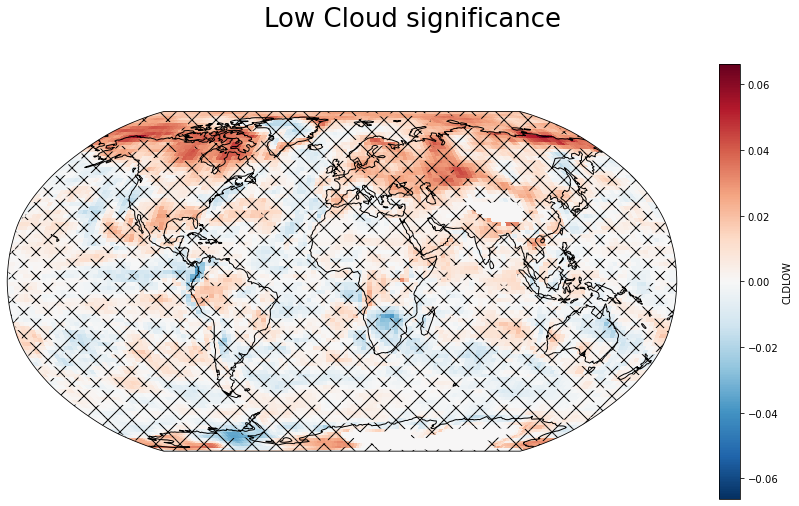

In [399]:
# Overlaying this on results means we just have to drop the hexbin alpha to zero as not to interfere with our primary plot
sig_mask = sig_results.where(sig_results >= 0.05)

X, Y = np.meshgrid(sig_results.lon, sig_results.lat) 
f, ax = plt.subplots(1, 1, figsize=(15, 8), facecolor='w', subplot_kw={'projection': ccrs.Robinson()})
f.suptitle(f"Low Cloud significance", fontsize=26)

(s4_cldlow_ds-s3_cldlow_ds).mean(dim="time").plot(ax=ax, transform=ccrs.PlateCarree())
ax.hexbin(X.reshape(-1), Y.reshape(-1), sig_mask.data.reshape(-1), hatch='x', alpha=0, transform=ccrs.PlateCarree())
ax.coastlines()

In [400]:
# -----------------------------

## Statistical Analysis and Uncertainty Code (CLDMED)

In [401]:
# Load datasets for XAER and ALL
# all_paths, xaer_paths = tmin_paths()

# Maybe we want to select a particluar time period, say 1960-1989. We use the slice() function to include multiple years within a range
s4_cldmed_ds = S4_CLDMED.CLDMED.isel(time=slice(467,720))
s3_cldmed_ds = S3_CLDMED.CLDMED.isel(time=slice(467,720))

In [402]:
# Unfortunately, xarray is a bit too slow for running the t-test point by point, so we will need to
# do some data manipulation to achieve this in a reasonable amount of time. If I find a better way
# to do it, then I'll let you know. But for now, we need to convert to numpy, do the test, and then
# convert back to xarray.

from scipy.stats import ttest_ind # this is the function for computing the Welch's t-test

# Here we convert from xarray to numpy, losing most attributes and features but increasing performance
s4_array = s4_cldmed_ds.values
s3_array = s3_cldmed_ds.values

def welch_t_test(s4_pt, s3_pt, lat, lon):
    # Confirmed that Sarah's modified t test is just a welches t test using my own code
    t_val, p_val = ttest_ind(s4_pt, s3_pt, equal_var=False)
    return ((lat, lon), p_val)

results = []
# We then iterate through each point in the datasets
for lati, lat in enumerate(s4_cldmed_ds.lat.values):
    for loni, lon in enumerate(s4_cldmed_ds.lon.values):
        # This is when things get a bit tricky. Basically, since the numpy arrays don't have fancy labels
        # they get treated as true arrays. Meaning we need to access them like arrays are accessed in C or
        # other lower-level programming languages: we use indices, not values.
        # The first coordinate in the array accesses members, and here we are specifying to access indices
        # 0 through the size of the array, so basically all members.
        # The second coordinate accesses time, and we do the same: from 0 to the end.
        # The thrid and fourth access lat and lon respectively, so we only one for each that specify the point
        s4_pt = s4_array[0:s4_cldmed_ds["time"].size, lati, loni].flatten()
        # Lastly, we flatten the array, which basically takes all elements and puts them into a single dimension
        # The result is a 1-d array with size equal to the number of members times the number of years
        s3_pt = s3_array[0:s3_cldmed_ds["time"].size, lati, loni].flatten()
        
        # With the two 1-d arrays, we can preform a t-test and obtain a t-value and p-value
        t_value, p_value = ttest_ind(s4_pt, s3_pt, equal_var=False) # We specify that the variances are not equal
        # We then store the p_value in an array along with the coordinates for the point in a tuple
        results.append(((lat, lon), p_value))

# We can preform a quick check to make sure everything went correctly. Since we ran a t-test on each point
# then we should have a list of results that is equal in length to the number of points we have.
if len(results) != s4_cldmed_ds.lat.size*s4_cldmed_ds.lon.size:
    raise RuntimeError(f'The results do not match the original dataset size!')

# To carry over our attributes, we make a copy of the ALL dataset, set everything to zero, and rename the variable
sig_results = (s4_cldmed_ds.mean(dim="time").load() * 0).rename("p-value")
# We then iterate through each point in the results
for (lat, lon), p_value in results: # Note how we unpack the tuple in the for loop header
    # We then locate the point in the ALL copy we made and change the value from 0 to whatever the p-value is
    sig_results.loc[dict(lat=lat, lon=lon)] = p_value

# Now we have a dataset of the same lat-lon dimensions as ALL and XAER with p-values for each point
sig_results

<xarray.DataArray 'p-value' (lat: 96, lon: 144)>
array([[0.8674088 , 0.8674088 , 0.8674088 , ..., 0.8674088 , 0.8674088 ,
        0.8674088 ],
       [0.7887488 , 0.8042242 , 0.77396476, ..., 0.7845166 , 0.7706675 ,
        0.7802835 ],
       [0.33589715, 0.28032172, 0.25450218, ..., 0.35747263, 0.39334768,
        0.39066714],
       ...,
       [0.82296395, 0.83041584, 0.82296   , ..., 0.8427724 , 0.8528873 ,
        0.8544541 ],
       [0.49301413, 0.50133044, 0.5001693 , ..., 0.4672833 , 0.47266138,
        0.4758863 ],
       [0.18535443, 0.18535747, 0.1853631 , ..., 0.18536456, 0.18536392,
        0.18536629]], dtype=float32)
Coordinates:
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lon      (lon) float64 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5

In [403]:
# f, ax = plt.subplots(1, 1, figsize=(30, 10), facecolor='w', subplot_kw={'projection': ccrs.Robinson()})
# sig_results.plot(ax=ax)

In [404]:
# import numpy as np
# # For overlay on top of the ALL results, we will need to convert our results into a boolean array, indicating T/F for whether or not
# # the p-value exceeds our significance threshold of 5%
# sig_mask = sig_results.where(sig_results >= 0.05) # All points that exceed 5% will be marked true, indicating they are not significantly different

# # For an overlay, we want to use hexbin()
# # hexbin() needs a finer set of axis for plotting, so we create a meshgrid of the same dimensions
# X, Y = np.meshgrid(sig_results.lon, sig_results.lat) # This will basically interpolate values in between each lat/lon value to make a finer grid
# f, ax = plt.subplots(1, 1, figsize=(30, 10), facecolor='w', subplot_kw={'projection': ccrs.Robinson()})

# ax.hexbin(X.reshape(-1), Y.reshape(-1), sig_mask.data.reshape(-1), hatch='x', alpha=0.6, transform=ccrs.PlateCarree())
# # Note that transform is needed in order to use other projections like the Robinson projection here
# # We can also control how to view the p-value (if we want to see it)
# ax.coastlines() # Adds contour of coastlines

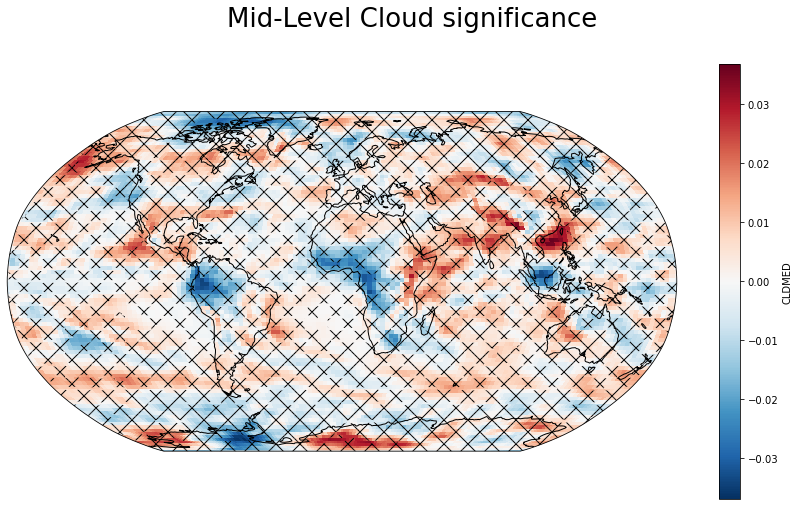

In [405]:
# Overlaying this on results means we just have to drop the hexbin alpha to zero as not to interfere with our primary plot
sig_mask = sig_results.where(sig_results >= 0.05)

X, Y = np.meshgrid(sig_results.lon, sig_results.lat) 
f, ax = plt.subplots(1, 1, figsize=(15, 8), facecolor='w', subplot_kw={'projection': ccrs.Robinson()})
f.suptitle(f"Mid-Level Cloud significance", fontsize=26)

(s4_cldmed_ds-s3_cldmed_ds).mean(dim="time").plot(ax=ax, transform=ccrs.PlateCarree())
ax.hexbin(X.reshape(-1), Y.reshape(-1), sig_mask.data.reshape(-1), hatch='x', alpha=0, transform=ccrs.PlateCarree())
ax.coastlines()

In [406]:
#---------------------

In [407]:
# Load datasets for XAER and ALL
# all_paths, xaer_paths = tmin_paths()

# Maybe we want to select a particluar time period, say 1960-1989. We use the slice() function to include multiple years within a range
s4_cldhgh_ds = S4_CLDHGH.CLDHGH.isel(time=slice(467,720))
s3_cldhgh_ds = S3_CLDHGH.CLDHGH.isel(time=slice(467,720))

In [408]:
# Unfortunately, xarray is a bit too slow for running the t-test point by point, so we will need to
# do some data manipulation to achieve this in a reasonable amount of time. If I find a better way
# to do it, then I'll let you know. But for now, we need to convert to numpy, do the test, and then
# convert back to xarray.

from scipy.stats import ttest_ind # this is the function for computing the Welch's t-test

# Here we convert from xarray to numpy, losing most attributes and features but increasing performance
s4_array = s4_cldhgh_ds.values
s3_array = s3_cldhgh_ds.values

def welch_t_test(s4_pt, s3_pt, lat, lon):
    # Confirmed that Sarah's modified t test is just a welches t test using my own code
    t_val, p_val = ttest_ind(s4_pt, s3_pt, equal_var=False)
    return ((lat, lon), p_val)

results = []
# We then iterate through each point in the datasets
for lati, lat in enumerate(s4_cldhgh_ds.lat.values):
    for loni, lon in enumerate(s4_cldhgh_ds.lon.values):
        # This is when things get a bit tricky. Basically, since the numpy arrays don't have fancy labels
        # they get treated as true arrays. Meaning we need to access them like arrays are accessed in C or
        # other lower-level programming languages: we use indices, not values.
        # The first coordinate in the array accesses members, and here we are specifying to access indices
        # 0 through the size of the array, so basically all members.
        # The second coordinate accesses time, and we do the same: from 0 to the end.
        # The thrid and fourth access lat and lon respectively, so we only one for each that specify the point
        s4_pt = s4_array[0:s4_cldhgh_ds["time"].size, lati, loni].flatten()
        # Lastly, we flatten the array, which basically takes all elements and puts them into a single dimension
        # The result is a 1-d array with size equal to the number of members times the number of years
        s3_pt = s3_array[0:s3_cldhgh_ds["time"].size, lati, loni].flatten()
        
        # With the two 1-d arrays, we can preform a t-test and obtain a t-value and p-value
        t_value, p_value = ttest_ind(s4_pt, s3_pt, equal_var=False) # We specify that the variances are not equal
        # We then store the p_value in an array along with the coordinates for the point in a tuple
        results.append(((lat, lon), p_value))

# We can preform a quick check to make sure everything went correctly. Since we ran a t-test on each point
# then we should have a list of results that is equal in length to the number of points we have.
if len(results) != s4_cldhgh_ds.lat.size*s4_cldhgh_ds.lon.size:
    raise RuntimeError(f'The results do not match the original dataset size!')

# To carry over our attributes, we make a copy of the ALL dataset, set everything to zero, and rename the variable
sig_results = (s4_cldhgh_ds.mean(dim="time").load() * 0).rename("p-value")
# We then iterate through each point in the results
for (lat, lon), p_value in results: # Note how we unpack the tuple in the for loop header
    # We then locate the point in the ALL copy we made and change the value from 0 to whatever the p-value is
    sig_results.loc[dict(lat=lat, lon=lon)] = p_value

# Now we have a dataset of the same lat-lon dimensions as ALL and XAER with p-values for each point
sig_results

<xarray.DataArray 'p-value' (lat: 96, lon: 144)>
array([[0.3086155 , 0.3086155 , 0.3086155 , ..., 0.3086155 , 0.3086155 ,
        0.3086155 ],
       [0.5533127 , 0.5530649 , 0.55389464, ..., 0.53429556, 0.54923457,
        0.55191165],
       [0.8082909 , 0.7984058 , 0.74511296, ..., 0.865448  , 0.8014937 ,
        0.7352244 ],
       ...,
       [0.93624645, 0.9472728 , 0.95638466, ..., 0.9011917 , 0.8975322 ,
        0.910392  ],
       [0.74708   , 0.7612032 , 0.7769597 , ..., 0.7107114 , 0.72504056,
        0.7388547 ],
       [0.54024476, 0.54024476, 0.5402316 , ..., 0.5402331 , 0.5402431 ,
        0.54024637]], dtype=float32)
Coordinates:
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lon      (lon) float64 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5

In [409]:
# f, ax = plt.subplots(1, 1, figsize=(30, 10), facecolor='w', subplot_kw={'projection': ccrs.Robinson()})
# sig_results.plot(ax=ax)

In [410]:
# import numpy as np
# # For overlay on top of the ALL results, we will need to convert our results into a boolean array, indicating T/F for whether or not
# # the p-value exceeds our significance threshold of 5%
# sig_mask = sig_results.where(sig_results >= 0.05) # All points that exceed 5% will be marked true, indicating they are not significantly different

# # For an overlay, we want to use hexbin()
# # hexbin() needs a finer set of axis for plotting, so we create a meshgrid of the same dimensions
# X, Y = np.meshgrid(sig_results.lon, sig_results.lat) # This will basically interpolate values in between each lat/lon value to make a finer grid
# f, ax = plt.subplots(1, 1, figsize=(30, 10), facecolor='w', subplot_kw={'projection': ccrs.Robinson()})

# ax.hexbin(X.reshape(-1), Y.reshape(-1), sig_mask.data.reshape(-1), hatch='x', alpha=0.6, transform=ccrs.PlateCarree())
# # Note that transform is needed in order to use other projections like the Robinson projection here
# # We can also control how to view the p-value (if we want to see it)
# ax.coastlines() # Adds contour of coastlines

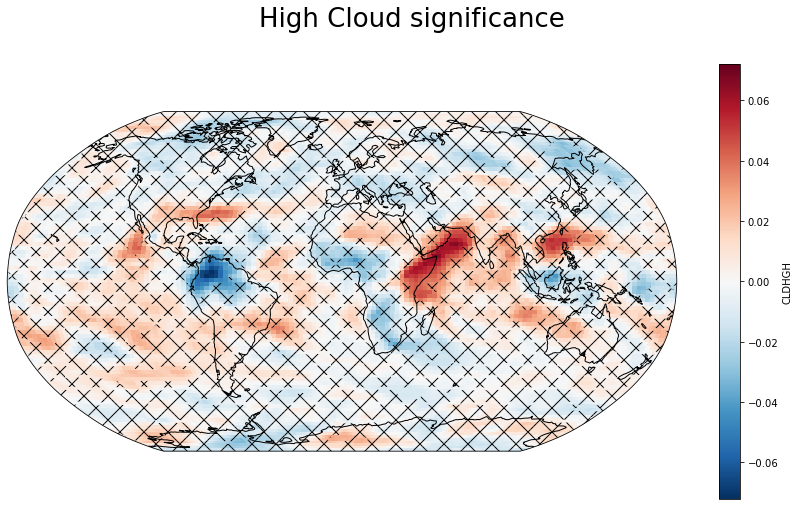

In [411]:
# Overlaying this on results means we just have to drop the hexbin alpha to zero as not to interfere with our primary plot
sig_mask = sig_results.where(sig_results >= 0.05)

X, Y = np.meshgrid(sig_results.lon, sig_results.lat) 
f, ax = plt.subplots(1, 1, figsize=(15, 8), facecolor='w', subplot_kw={'projection': ccrs.Robinson()})
f.suptitle(f"High Cloud significance", fontsize=26)

(s4_cldhgh_ds-s3_cldhgh_ds).mean(dim="time").plot(ax=ax, transform=ccrs.PlateCarree())
ax.hexbin(X.reshape(-1), Y.reshape(-1), sig_mask.data.reshape(-1), hatch='x', alpha=0, transform=ccrs.PlateCarree())
ax.coastlines()

In [412]:
CLDLOW_diff = (S4_CLDLOW.CLDLOW.isel(time=slice(467,720)).mean('time', keep_attrs=True)
               - S3_CLDLOW.CLDLOW.isel(time=slice(467,720)).mean('time', keep_attrs=True))
CLDMED_diff = (S4_CLDMED.CLDMED.isel(time=slice(467,720)).mean('time', keep_attrs=True)
               - S3_CLDMED.CLDMED.isel(time=slice(467,720)).mean('time', keep_attrs=True))
CLDHGH_diff = (S4_CLDHGH.CLDHGH.isel(time=slice(467,720)).mean('time', keep_attrs=True)
               - S3_CLDHGH.CLDHGH.isel(time=slice(467,720)).mean('time', keep_attrs=True))
CLDTOT_diff = (S4_CLDTOT.CLDTOT.isel(time=slice(467,720)).mean('time', keep_attrs=True)
               - S3_CLDTOT.CLDTOT.isel(time=slice(467,720)).mean('time', keep_attrs=True))

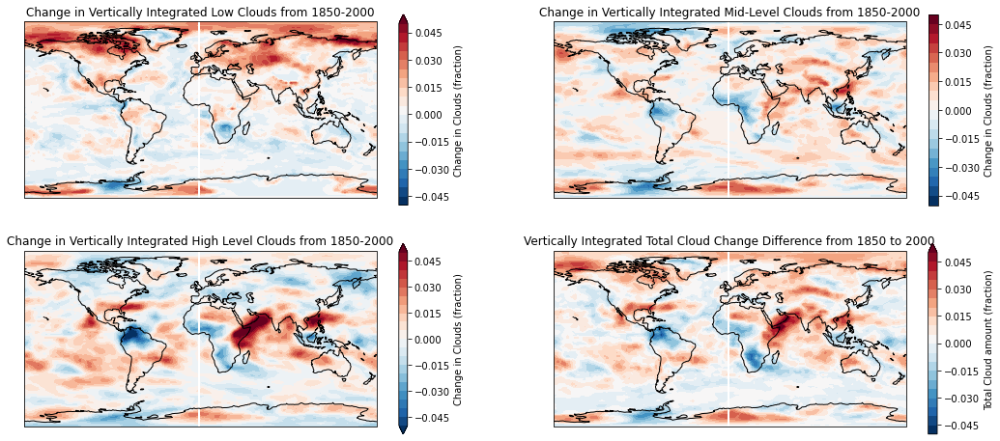

In [413]:
fig = plt.figure(figsize=[18,8])
ax = fig.add_subplot(221,projection=ccrs.PlateCarree())
CLDLOW_diff.plot.contourf(ax=ax,levels=np.linspace(-0.05,0.05,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Change in Clouds (fraction)'})
ax.coastlines()
ax.set_title('Change in Vertically Integrated Low Clouds from 1850-2000')

ax2 = fig.add_subplot(222,projection=ccrs.PlateCarree())
CLDMED_diff.plot.contourf(ax=ax2,levels=np.linspace(-0.05,0.05,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Change in Clouds (fraction)'})
ax2.coastlines()
ax2.set_title('Change in Vertically Integrated Mid-Level Clouds from 1850-2000')

ax3 = fig.add_subplot(223,projection=ccrs.PlateCarree())
CLDHGH_diff.plot.contourf(ax=ax3,levels=np.linspace(-0.05,0.05,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Change in Clouds (fraction)'})
ax3.coastlines()
ax3.set_title('Change in Vertically Integrated High Level Clouds from 1850-2000')

ax4 = fig.add_subplot(224,projection=ccrs.PlateCarree())
CLDTOT_diff.plot.contourf(ax=ax4,levels=np.linspace(-0.05,0.05,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Total Cloud amount (fraction)'})
ax4.coastlines()
ax4.set_title('Vertically Integrated Total Cloud Change Difference from 1850 to 2000')

plt.show();

There is a big increase in low clouds in the North Pole region and in high Northern latitudes. A slight decrease in low cloud cover over the oceans.
There is an overall slight increase in mid-level clouds with decreases over Northern South America and the congo region. A slight decrease in the western North Pole.
There is a large decrease in high level clouds in Northern South America  and the West African region. With a very large increase over the East African and middle eastern area.
But, it does look like the overall summation of these plots equals the total cloud distribution. 

These dont really match the indirect ERF changes. Why not?

Cloud type or regime can be a strong determinant in the responses of cloud properties to aerosol driven changes like increase in droplet number. These processes could be more important than the ACI themselves. (Bellouin)
Stratoculmulus clouds are most sensitive to aerosol perturbations?


### Map of Liquid Water Path (TGCLDLWP):

In [414]:
S3_TGCLDLWP = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/TGCLDLWP.F_2000_CAM5_1850aero.mon.001-60.nc')
S4_TGCLDLWP = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/TGCLDLWP.F_2000_CAM5_good.mon.001-60.nc')

In [415]:
S3_TGCLDLWP.TGCLDLWP

<xarray.DataArray 'TGCLDLWP' (time: 720, lat: 96, lon: 144)>
[9953280 values with dtype=float32]
Coordinates:
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lon      (lon) float64 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
  * time     (time) object 0001-02-01 00:00:00 ... 0061-01-01 00:00:00
Attributes:
    units:         kg/m2
    long_name:     Total grid-box cloud liquid water path
    cell_methods:  time: mean

In [416]:
TGCLDLWP_diff = (S4_TGCLDLWP.TGCLDLWP.isel(time=slice(467,720)).mean('time', keep_attrs=True)
              - S3_TGCLDLWP.TGCLDLWP.isel(time=slice(467,720)).mean('time', keep_attrs=True))

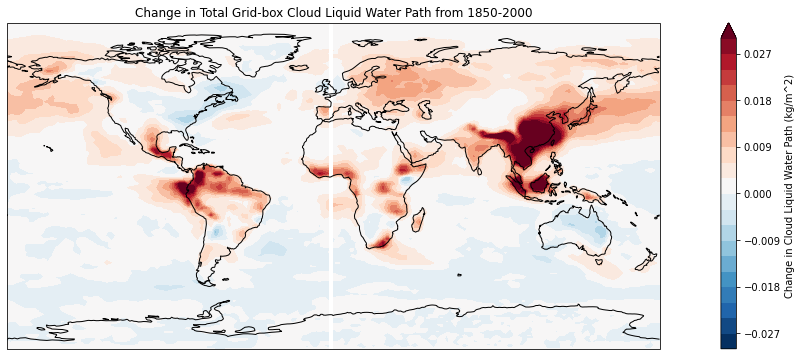

In [417]:
fig = plt.figure(figsize=[22,6])
ax = fig.add_subplot(111,projection=ccrs.PlateCarree())
TGCLDLWP_diff.plot.contourf(ax=ax,levels=np.linspace(-0.03,0.03,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Change in Cloud Liquid Water Path (kg/m^2)'})
ax.coastlines()
ax.set_title('Change in Total Grid-box Cloud Liquid Water Path from 1850-2000')
plt.show();

This map shows that from 1850 to 2000, we have a large increase in the liquid water path in the areas where the indirect ERF and cloud coverage are strong. This lines up with what we would have predicted. An increased liquid water path means more water in the cloud which will scatter more light (stronger indirect ERF) and create brighter clouds. 

#### Significance Test (TGCLDLWP)

In [418]:
# Load datasets for XAER and ALL
# all_paths, xaer_paths = tmin_paths()

# Maybe we want to select a particluar time period, say 1960-1989. We use the slice() function to include multiple years within a range
s4_lwp_ds = S4_TGCLDLWP.TGCLDLWP.isel(time=slice(467,720))
s3_lwp_ds = S3_TGCLDLWP.TGCLDLWP.isel(time=slice(467,720))

In [419]:
# Unfortunately, xarray is a bit too slow for running the t-test point by point, so we will need to
# do some data manipulation to achieve this in a reasonable amount of time. If I find a better way
# to do it, then I'll let you know. But for now, we need to convert to numpy, do the test, and then
# convert back to xarray.

from scipy.stats import ttest_ind # this is the function for computing the Welch's t-test

# Here we convert from xarray to numpy, losing most attributes and features but increasing performance
s4_array = s4_lwp_ds.values
s3_array = s3_lwp_ds.values

def welch_t_test(s4_pt, s3_pt, lat, lon):
    # Confirmed that Sarah's modified t test is just a welches t test using my own code
    t_val, p_val = ttest_ind(s4_pt, s3_pt, equal_var=False)
    return ((lat, lon), p_val)

results = []
# We then iterate through each point in the datasets
for lati, lat in enumerate(s4_lwp_ds.lat.values):
    for loni, lon in enumerate(s4_lwp_ds.lon.values):
        # This is when things get a bit tricky. Basically, since the numpy arrays don't have fancy labels
        # they get treated as true arrays. Meaning we need to access them like arrays are accessed in C or
        # other lower-level programming languages: we use indices, not values.
        # The first coordinate in the array accesses members, and here we are specifying to access indices
        # 0 through the size of the array, so basically all members.
        # The second coordinate accesses time, and we do the same: from 0 to the end.
        # The thrid and fourth access lat and lon respectively, so we only one for each that specify the point
        s4_pt = s4_array[0:s4_lwp_ds["time"].size, lati, loni].flatten()
        # Lastly, we flatten the array, which basically takes all elements and puts them into a single dimension
        # The result is a 1-d array with size equal to the number of members times the number of years
        s3_pt = s3_array[0:s3_lwp_ds["time"].size, lati, loni].flatten()
        
        # With the two 1-d arrays, we can preform a t-test and obtain a t-value and p-value
        t_value, p_value = ttest_ind(s4_pt, s3_pt, equal_var=False) # We specify that the variances are not equal
        # We then store the p_value in an array along with the coordinates for the point in a tuple
        results.append(((lat, lon), p_value))

# We can preform a quick check to make sure everything went correctly. Since we ran a t-test on each point
# then we should have a list of results that is equal in length to the number of points we have.
if len(results) != s4_lwp_ds.lat.size*s4_lwp_ds.lon.size:
    raise RuntimeError(f'The results do not match the original dataset size!')

# To carry over our attributes, we make a copy of the ALL dataset, set everything to zero, and rename the variable
sig_results = (s4_lwp_ds.mean(dim="time").load() * 0).rename("p-value")
# We then iterate through each point in the results
for (lat, lon), p_value in results: # Note how we unpack the tuple in the for loop header
    # We then locate the point in the ALL copy we made and change the value from 0 to whatever the p-value is
    sig_results.loc[dict(lat=lat, lon=lon)] = p_value

# Now we have a dataset of the same lat-lon dimensions as ALL and XAER with p-values for each point
sig_results

<xarray.DataArray 'p-value' (lat: 96, lon: 144)>
array([[0.3182743 , 0.3182743 , 0.3182743 , ..., 0.3182743 , 0.3182743 ,
        0.3182743 ],
       [0.31584382, 0.32281917, 0.14740914, ..., 0.7772088 , 0.31697816,
        0.61480486],
       [0.70553505, 0.5814575 , 0.31873903, ..., 0.9141114 , 0.31817663,
        0.33211008],
       ...,
       [0.08947908, 0.10077492, 0.11215541, ..., 0.06913311, 0.06459916,
        0.0666697 ],
       [0.02532568, 0.02614315, 0.02343268, ..., 0.02358731, 0.02612069,
        0.02460822],
       [0.00673743, 0.0067005 , 0.00683587, ..., 0.00680015, 0.00674293,
        0.00675709]], dtype=float32)
Coordinates:
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lon      (lon) float64 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5

In [420]:
# f, ax = plt.subplots(1, 1, figsize=(30, 10), facecolor='w', subplot_kw={'projection': ccrs.Robinson()})
# sig_results.plot(ax=ax)

In [421]:
# import numpy as np
# # For overlay on top of the ALL results, we will need to convert our results into a boolean array, indicating T/F for whether or not
# # the p-value exceeds our significance threshold of 5%
# sig_mask = sig_results.where(sig_results >= 0.05) # All points that exceed 5% will be marked true, indicating they are not significantly different

# # For an overlay, we want to use hexbin()
# # hexbin() needs a finer set of axis for plotting, so we create a meshgrid of the same dimensions
# X, Y = np.meshgrid(sig_results.lon, sig_results.lat) # This will basically interpolate values in between each lat/lon value to make a finer grid
# f, ax = plt.subplots(1, 1, figsize=(30, 10), facecolor='w', subplot_kw={'projection': ccrs.Robinson()})

# ax.hexbin(X.reshape(-1), Y.reshape(-1), sig_mask.data.reshape(-1), hatch='x', alpha=0.6, transform=ccrs.PlateCarree())
# # Note that transform is needed in order to use other projections like the Robinson projection here
# # We can also control how to view the p-value (if we want to see it)
# ax.coastlines() # Adds contour of coastlines

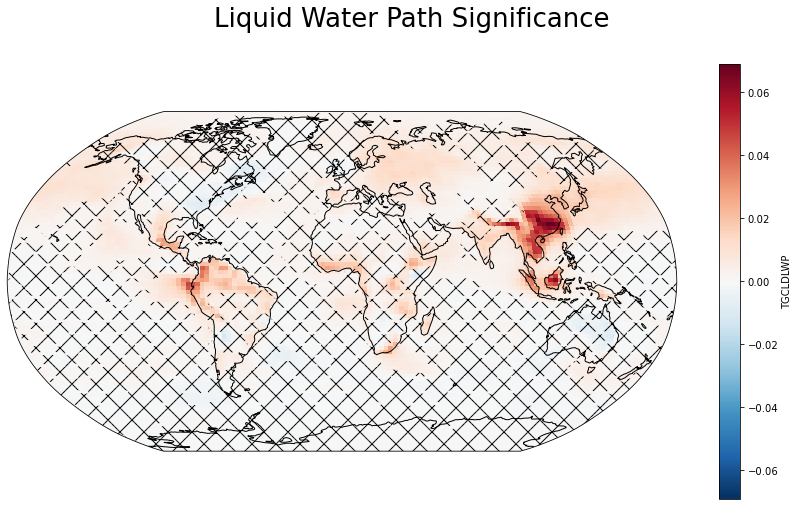

In [422]:
# Overlaying this on results means we just have to drop the hexbin alpha to zero as not to interfere with our primary plot
sig_mask = sig_results.where(sig_results >= 0.05)

X, Y = np.meshgrid(sig_results.lon, sig_results.lat) 
f, ax = plt.subplots(1, 1, figsize=(15, 8), facecolor='w', subplot_kw={'projection': ccrs.Robinson()})
f.suptitle(f"Liquid Water Path Significance", fontsize=26)

(s4_lwp_ds-s3_lwp_ds).mean(dim="time").plot(ax=ax, transform=ccrs.PlateCarree())
ax.hexbin(X.reshape(-1), Y.reshape(-1), sig_mask.data.reshape(-1), hatch='x', alpha=0, transform=ccrs.PlateCarree())
ax.coastlines()

### Map of Cloud Droplet Number Concentration (CDNUMC):

In [423]:
S3_CDNUMC = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/CDNUMC.F_2000_CAM5_1850aero.mon.001-60.nc')
S4_CDNUMC = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/CDNUMC.F_2000_CAM5_good.mon.001-60.nc')

In [424]:
S3_CDNUMC.CDNUMC

<xarray.DataArray 'CDNUMC' (time: 720, lat: 96, lon: 144)>
[9953280 values with dtype=float32]
Coordinates:
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lon      (lon) float64 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
  * time     (time) object 0001-02-01 00:00:00 ... 0061-01-01 00:00:00
Attributes:
    units:         1/m2
    long_name:     Vertically-integrated droplet concentration
    cell_methods:  time: mean

In [425]:
CDNUMC_diff = (S4_CDNUMC.CDNUMC.isel(time=slice(467,720)).mean('time', keep_attrs=True)
              - S3_CDNUMC.CDNUMC.isel(time=slice(467,720)).mean('time', keep_attrs=True))

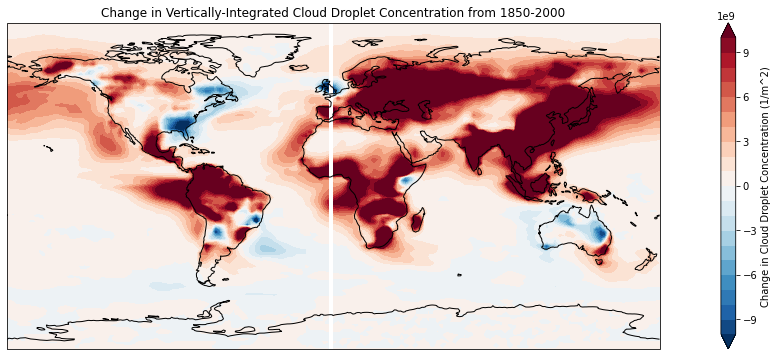

In [426]:
fig = plt.figure(figsize=[22,6])
ax = fig.add_subplot(111,projection=ccrs.PlateCarree())
CDNUMC_diff.plot.contourf(ax=ax,levels=np.linspace(-1e10,1e10,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Change in Cloud Droplet Concentration (1/m^2)'})
ax.coastlines()
ax.set_title('Change in Vertically-Integrated Cloud Droplet Concentration from 1850-2000')
plt.show();

What are the units here and why are they so large? What does this mean?
There is a really large increase in cloud droplet number concentrations in the areas where there is an increase in liquid water path and indirect ERF. This makes sense from what we know. An increase in the number of smaller, cloud droplets leads to increased liquid water path in the cloud which increases the brightness and the indirect ERF. Can we look at the effective radius? Lets see if it matches up?

##### Significance of Cloud Droplet Number Concentration

In [427]:
# Load datasets for XAER and ALL
# all_paths, xaer_paths = tmin_paths()

# Maybe we want to select a particluar time period, say 1960-1989. We use the slice() function to include multiple years within a range
s4_cdnc_ds = S4_CDNUMC.CDNUMC.isel(time=slice(467,720))
s3_cdnc_ds = S3_CDNUMC.CDNUMC.isel(time=slice(467,720))

In [428]:
# Unfortunately, xarray is a bit too slow for running the t-test point by point, so we will need to
# do some data manipulation to achieve this in a reasonable amount of time. If I find a better way
# to do it, then I'll let you know. But for now, we need to convert to numpy, do the test, and then
# convert back to xarray.

from scipy.stats import ttest_ind # this is the function for computing the Welch's t-test

# Here we convert from xarray to numpy, losing most attributes and features but increasing performance
s4_array = s4_cdnc_ds.values
s3_array = s3_cdnc_ds.values

def welch_t_test(s4_pt, s3_pt, lat, lon):
    # Confirmed that Sarah's modified t test is just a welches t test using my own code
    t_val, p_val = ttest_ind(s4_pt, s3_pt, equal_var=False)
    return ((lat, lon), p_val)

results = []
# We then iterate through each point in the datasets
for lati, lat in enumerate(s4_cdnc_ds.lat.values):
    for loni, lon in enumerate(s4_cdnc_ds.lon.values):
        # This is when things get a bit tricky. Basically, since the numpy arrays don't have fancy labels
        # they get treated as true arrays. Meaning we need to access them like arrays are accessed in C or
        # other lower-level programming languages: we use indices, not values.
        # The first coordinate in the array accesses members, and here we are specifying to access indices
        # 0 through the size of the array, so basically all members.
        # The second coordinate accesses time, and we do the same: from 0 to the end.
        # The thrid and fourth access lat and lon respectively, so we only one for each that specify the point
        s4_pt = s4_array[0:s4_cdnc_ds["time"].size, lati, loni].flatten()
        # Lastly, we flatten the array, which basically takes all elements and puts them into a single dimension
        # The result is a 1-d array with size equal to the number of members times the number of years
        s3_pt = s3_array[0:s3_cdnc_ds["time"].size, lati, loni].flatten()
        
        # With the two 1-d arrays, we can preform a t-test and obtain a t-value and p-value
        t_value, p_value = ttest_ind(s4_pt, s3_pt, equal_var=False) # We specify that the variances are not equal
        # We then store the p_value in an array along with the coordinates for the point in a tuple
        results.append(((lat, lon), p_value))

# We can preform a quick check to make sure everything went correctly. Since we ran a t-test on each point
# then we should have a list of results that is equal in length to the number of points we have.
if len(results) != s4_cdnc_ds.lat.size*s4_cdnc_ds.lon.size:
    raise RuntimeError(f'The results do not match the original dataset size!')

# To carry over our attributes, we make a copy of the ALL dataset, set everything to zero, and rename the variable
sig_results = (s4_cdnc_ds.mean(dim="time").load() * 0).rename("p-value")
# We then iterate through each point in the results
for (lat, lon), p_value in results: # Note how we unpack the tuple in the for loop header
    # We then locate the point in the ALL copy we made and change the value from 0 to whatever the p-value is
    sig_results.loc[dict(lat=lat, lon=lon)] = p_value

# Now we have a dataset of the same lat-lon dimensions as ALL and XAER with p-values for each point
sig_results

<xarray.DataArray 'p-value' (lat: 96, lon: 144)>
array([[0.6200362 , 0.6200414 , 0.62004113, ..., 0.6200415 , 0.62003887,
        0.6200316 ],
       [0.30829188, 0.17126812, 0.19844298, ..., 0.44130832, 0.3169615 ,
        0.29355046],
       [0.3079971 , 0.32026595, 0.33566073, ..., 0.43529776, 0.31724083,
        0.71998084],
       ...,
       [0.03020152, 0.03347536, 0.03086574, ..., 0.02333446, 0.0178309 ,
        0.01895526],
       [0.00457505, 0.00389801, 0.00370618, ..., 0.00512558, 0.0056754 ,
        0.0045194 ],
       [0.00121089, 0.00120591, 0.00122939, ..., 0.00120974, 0.00120578,
        0.00120754]], dtype=float32)
Coordinates:
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lon      (lon) float64 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5

In [429]:
# f, ax = plt.subplots(1, 1, figsize=(30, 10), facecolor='w', subplot_kw={'projection': ccrs.Robinson()})
# sig_results.plot(ax=ax)

In [430]:
# import numpy as np
# # For overlay on top of the ALL results, we will need to convert our results into a boolean array, indicating T/F for whether or not
# # the p-value exceeds our significance threshold of 5%
# sig_mask = sig_results.where(sig_results >= 0.05) # All points that exceed 5% will be marked true, indicating they are not significantly different

# # For an overlay, we want to use hexbin()
# # hexbin() needs a finer set of axis for plotting, so we create a meshgrid of the same dimensions
# X, Y = np.meshgrid(sig_results.lon, sig_results.lat) # This will basically interpolate values in between each lat/lon value to make a finer grid
# f, ax = plt.subplots(1, 1, figsize=(30, 10), facecolor='w', subplot_kw={'projection': ccrs.Robinson()})

# ax.hexbin(X.reshape(-1), Y.reshape(-1), sig_mask.data.reshape(-1), hatch='x', alpha=0.6, transform=ccrs.PlateCarree())
# # Note that transform is needed in order to use other projections like the Robinson projection here
# # We can also control how to view the p-value (if we want to see it)
# ax.coastlines() # Adds contour of coastlines

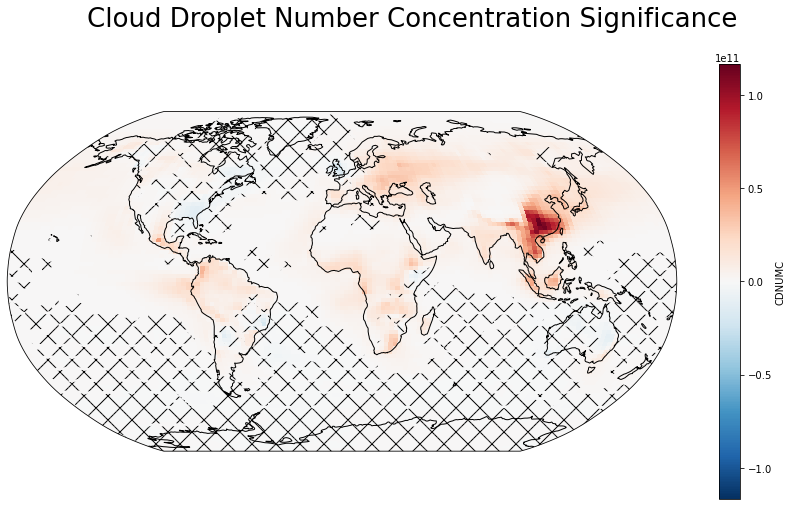

In [431]:
# Overlaying this on results means we just have to drop the hexbin alpha to zero as not to interfere with our primary plot
sig_mask = sig_results.where(sig_results >= 0.05)

X, Y = np.meshgrid(sig_results.lon, sig_results.lat) 
f, ax = plt.subplots(1, 1, figsize=(15, 8), facecolor='w', subplot_kw={'projection': ccrs.Robinson()})
f.suptitle(f"Cloud Droplet Number Concentration Significance", fontsize=26)

(s4_cdnc_ds-s3_cdnc_ds).mean(dim="time").plot(ax=ax, transform=ccrs.PlateCarree())
ax.hexbin(X.reshape(-1), Y.reshape(-1), sig_mask.data.reshape(-1), hatch='x', alpha=0, transform=ccrs.PlateCarree())
ax.coastlines()

__AREL__ (Average droplet effective radius)

OOOO theres a conversion from cloud water to cloud ice with bergeron variable!! But thats for another time to explore

#### Okay so Average Droplet Effective Radius (AREL):

In [7]:
S3_AREL = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/AREL.F_2000_CAM5_1850aero.mon.001-60.nc')
S4_AREL = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/AREL.F_2000_CAM5_good.mon.001-60.nc')

In [528]:
S3_AREL.AREL

<xarray.DataArray 'AREL' (time: 720, lev: 30, lat: 96, lon: 144)>
[298598400 values with dtype=float32]
Coordinates:
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lev      (lev) float64 3.643 7.595 14.36 24.61 ... 936.2 957.5 976.3 992.6
  * lon      (lon) float64 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
  * time     (time) object 0001-02-01 00:00:00 ... 0061-01-01 00:00:00
Attributes:
    mdims:         1
    units:         Micron
    long_name:     Average droplet effective radius
    cell_methods:  time: mean

In [434]:
# Here I am averaging vertically through the atmosphere as well. 
# Could be interesting to split this up by levels to see if it matches the clouds
AREL_diff = (S4_AREL.AREL.isel(time=slice(467,720)).mean('time', keep_attrs=True).mean(dim='lev')
              - S3_AREL.AREL.isel(time=slice(467,720)).mean('time', keep_attrs=True).mean(dim='lev'))

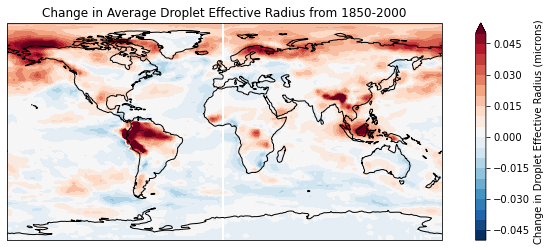

In [435]:
fig = plt.figure(figsize=[12,4])
ax = fig.add_subplot(111,projection=ccrs.PlateCarree())
AREL_diff.plot.contourf(ax=ax,levels=np.linspace(-0.05,0.05,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Change in Droplet Effective Radius (microns)'})
ax.coastlines()
ax.set_title('Change in Average Droplet Effective Radius from 1850-2000')
plt.show();

This does not look like what I would have expected. Why might this be the case? 
Where we see an increase in effective radius, we should be seeing a decrease in liquid water path and cloud droplet concentration. Therefore, the blue areas (decrease in effective radius) should line up with the red (increases) in cloud droplet concentration and the red (increase) in liquid water path. 

#### Significance Test for Effective Radius

In [436]:
# Load datasets for XAER and ALL
# all_paths, xaer_paths = tmin_paths()

# Maybe we want to select a particluar time period, say 1960-1989. We use the slice() function to include multiple years within a range
s4_er_ds = S4_AREL.AREL.isel(time=slice(467,720)).mean(dim='lev')
s3_er_ds = S3_AREL.AREL.isel(time=slice(467,720)).mean(dim='lev')

In [437]:
# Unfortunately, xarray is a bit too slow for running the t-test point by point, so we will need to
# do some data manipulation to achieve this in a reasonable amount of time. If I find a better way
# to do it, then I'll let you know. But for now, we need to convert to numpy, do the test, and then
# convert back to xarray.

from scipy.stats import ttest_ind # this is the function for computing the Welch's t-test

# Here we convert from xarray to numpy, losing most attributes and features but increasing performance
s4_array = s4_er_ds.values
s3_array = s3_er_ds.values

def welch_t_test(s4_pt, s3_pt, lat, lon):
    # Confirmed that Sarah's modified t test is just a welches t test using my own code
    t_val, p_val = ttest_ind(s4_pt, s3_pt, equal_var=False)
    return ((lat, lon), p_val)

results = []
# We then iterate through each point in the datasets
for lati, lat in enumerate(s4_er_ds.lat.values):
    for loni, lon in enumerate(s4_er_ds.lon.values):
        # This is when things get a bit tricky. Basically, since the numpy arrays don't have fancy labels
        # they get treated as true arrays. Meaning we need to access them like arrays are accessed in C or
        # other lower-level programming languages: we use indices, not values.
        # The first coordinate in the array accesses members, and here we are specifying to access indices
        # 0 through the size of the array, so basically all members.
        # The second coordinate accesses time, and we do the same: from 0 to the end.
        # The thrid and fourth access lat and lon respectively, so we only one for each that specify the point
        s4_pt = s4_array[0:s4_er_ds["time"].size, lati, loni].flatten()
        # Lastly, we flatten the array, which basically takes all elements and puts them into a single dimension
        # The result is a 1-d array with size equal to the number of members times the number of years
        s3_pt = s3_array[0:s3_er_ds["time"].size, lati, loni].flatten()
        
        # With the two 1-d arrays, we can preform a t-test and obtain a t-value and p-value
        t_value, p_value = ttest_ind(s4_pt, s3_pt, equal_var=False) # We specify that the variances are not equal
        # We then store the p_value in an array along with the coordinates for the point in a tuple
        results.append(((lat, lon), p_value))

# We can preform a quick check to make sure everything went correctly. Since we ran a t-test on each point
# then we should have a list of results that is equal in length to the number of points we have.
if len(results) != s4_er_ds.lat.size*s4_er_ds.lon.size:
    raise RuntimeError(f'The results do not match the original dataset size!')

# To carry over our attributes, we make a copy of the ALL dataset, set everything to zero, and rename the variable
sig_results = (s4_er_ds.mean(dim="time").load() * 0).rename("p-value")
# We then iterate through each point in the results
for (lat, lon), p_value in results: # Note how we unpack the tuple in the for loop header
    # We then locate the point in the ALL copy we made and change the value from 0 to whatever the p-value is
    sig_results.loc[dict(lat=lat, lon=lon)] = p_value

# Now we have a dataset of the same lat-lon dimensions as ALL and XAER with p-values for each point
sig_results

<xarray.DataArray 'p-value' (lat: 96, lon: 144)>
array([[       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan, 0.31826973,        nan, ...,        nan,        nan,
               nan],
       ...,
       [0.09066921, 0.12304117, 0.14918326, ..., 0.06516764, 0.06342911,
        0.05999748],
       [0.03981743, 0.04898157, 0.05015898, ..., 0.02390548, 0.03159602,
        0.03701554],
       [0.00445969, 0.00445694, 0.0045174 , ..., 0.0045242 , 0.00450779,
        0.0045377 ]], dtype=float32)
Coordinates:
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lon      (lon) float64 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5

In [438]:
# f, ax = plt.subplots(1, 1, figsize=(30, 10), facecolor='w', subplot_kw={'projection': ccrs.Robinson()})
# sig_results.plot(ax=ax)

In [439]:
# import numpy as np
# # For overlay on top of the ALL results, we will need to convert our results into a boolean array, indicating T/F for whether or not
# # the p-value exceeds our significance threshold of 5%
# sig_mask = sig_results.where(sig_results >= 0.05) # All points that exceed 5% will be marked true, indicating they are not significantly different

# # For an overlay, we want to use hexbin()
# # hexbin() needs a finer set of axis for plotting, so we create a meshgrid of the same dimensions
# X, Y = np.meshgrid(sig_results.lon, sig_results.lat) # This will basically interpolate values in between each lat/lon value to make a finer grid
# f, ax = plt.subplots(1, 1, figsize=(30, 10), facecolor='w', subplot_kw={'projection': ccrs.Robinson()})

# ax.hexbin(X.reshape(-1), Y.reshape(-1), sig_mask.data.reshape(-1), hatch='x', alpha=0.6, transform=ccrs.PlateCarree())
# # Note that transform is needed in order to use other projections like the Robinson projection here
# # We can also control how to view the p-value (if we want to see it)
# ax.coastlines() # Adds contour of coastlines

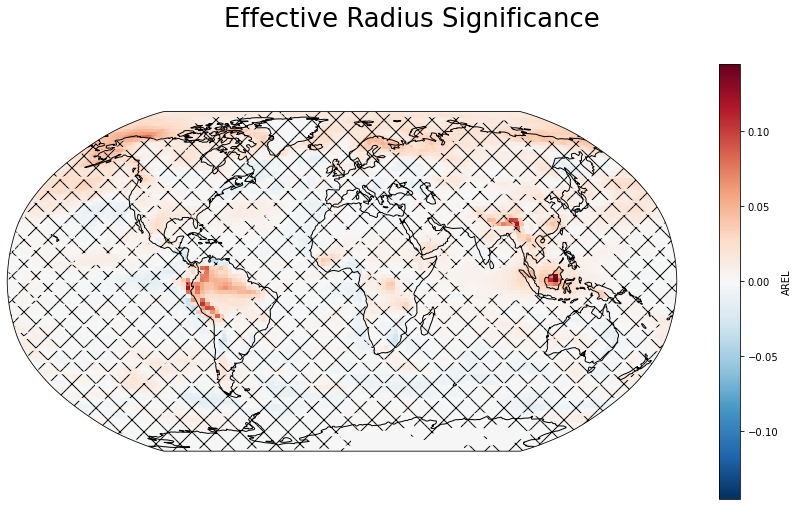

In [440]:
# Overlaying this on results means we just have to drop the hexbin alpha to zero as not to interfere with our primary plot
sig_mask = sig_results.where(sig_results >= 0.05)

X, Y = np.meshgrid(sig_results.lon, sig_results.lat) 
f, ax = plt.subplots(1, 1, figsize=(15, 8), facecolor='w', subplot_kw={'projection': ccrs.Robinson()})
f.suptitle(f"Effective Radius Significance", fontsize=26)

(s4_er_ds-s3_er_ds).mean(dim="time").plot(ax=ax, transform=ccrs.PlateCarree())
ax.hexbin(X.reshape(-1), Y.reshape(-1), sig_mask.data.reshape(-1), hatch='x', alpha=0, transform=ccrs.PlateCarree())
ax.coastlines()

### Map of Cloud Condensation Nuclei (CCN3):

This is CCN concentration at S=0.1%, where S is supersaturation? This means that it is showing CCN when something has condensed onto it?

In [441]:
s3_ccn = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/CCN3.F_2000_CAM5_1850aero.mon.001-60.nc')
s4_ccn = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/CCN3.F_2000_CAM5_good.mon.001-60.nc')

In [442]:
ccn_diff = (s4_ccn.CCN3.isel(time=slice(467,720)).mean('time', keep_attrs=True)
              - s3_ccn.CCN3.isel(time=slice(467,720)).mean('time', keep_attrs=True))

In [443]:
s3_ccn.CCN3

<xarray.DataArray 'CCN3' (time: 720, lev: 30, lat: 96, lon: 144)>
[298598400 values with dtype=float32]
Coordinates:
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lev      (lev) float64 3.643 7.595 14.36 24.61 ... 936.2 957.5 976.3 992.6
  * lon      (lon) float64 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
  * time     (time) object 0001-02-01 00:00:00 ... 0061-01-01 00:00:00
Attributes:
    mdims:         1
    units:         #/cm3
    long_name:     CCN concentration at S=0.1%
    cell_methods:  time: mean

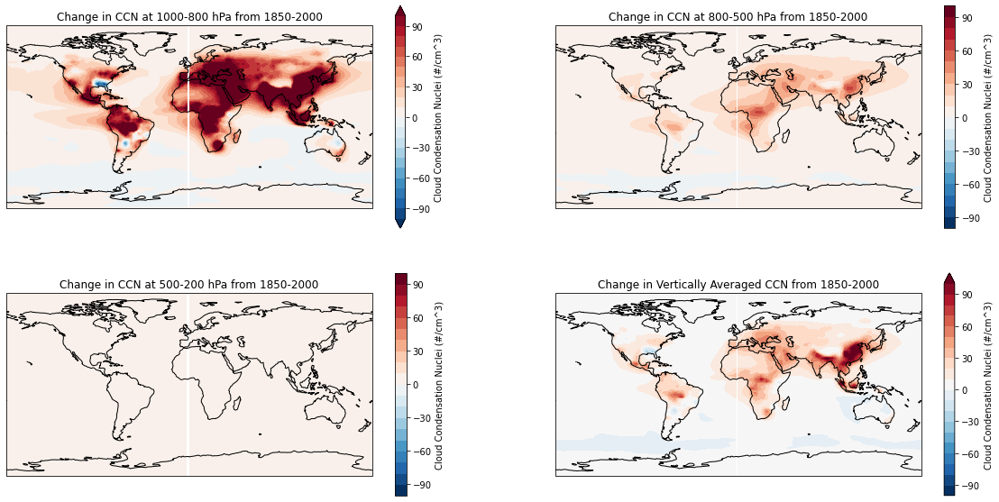

In [444]:
fig = plt.figure(figsize=[20,10])
ax = fig.add_subplot(221,projection=ccrs.PlateCarree())
ccn_diff.sel(lev=slice(800,1000)).mean('lev').plot.contourf(ax=ax,levels=np.linspace(-100,100,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Cloud Condensation Nuclei (#/cm^3)'})
ax.coastlines()
ax.set_title('Change in CCN at 1000-800 hPa from 1850-2000')

ax2 = fig.add_subplot(222,projection=ccrs.PlateCarree())
ccn_diff.sel(lev=slice(500,800)).mean('lev').plot.contourf(ax=ax2,levels=np.linspace(-100,100,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Cloud Condensation Nuclei (#/cm^3)'})
ax2.coastlines()
ax2.set_title('Change in CCN at 800-500 hPa from 1850-2000')

ax3 = fig.add_subplot(223,projection=ccrs.PlateCarree())
ccn_diff.sel(lev=slice(200,500)).mean('lev').plot.contourf(ax=ax3,levels=np.linspace(-100,100,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Cloud Condensation Nuclei (#/cm^3)'})
ax3.coastlines()
ax3.set_title('Change in CCN at 500-200 hPa from 1850-2000')

ax4 = fig.add_subplot(224,projection=ccrs.PlateCarree())
ccn_diff.mean('lev').plot.contourf(ax=ax4,levels=np.linspace(-100,100,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Cloud Condensation Nuclei (#/cm^3)'})
ax4.coastlines()
ax4.set_title('Change in Vertically Averaged CCN from 1850-2000')

plt.show();

I have a lot of low level increases near the surface which is what I would have expected to see. In general, I have increases in CCN in 3 of my strongest locations. But, this actually doesnt speak for where I have my largest increases in low level clouds so something else must be going on here. Thi salso means my high clouds are changing from something other than the aerosols since the aerosols are probably lower in the atmosphere? What could be driving this?

#### CCN Significance

In [445]:
# Load datasets for XAER and ALL
# all_paths, xaer_paths = tmin_paths()

# Maybe we want to select a particluar time period, say 1960-1989. We use the slice() function to include multiple years within a range
s4_ccn_ds = s4_ccn.CCN3.isel(time=slice(467,720)).mean(dim='lev')
s3_ccn_ds = s3_ccn.CCN3.isel(time=slice(467,720)).mean(dim='lev')

In [446]:
# Unfortunately, xarray is a bit too slow for running the t-test point by point, so we will need to
# do some data manipulation to achieve this in a reasonable amount of time. If I find a better way
# to do it, then I'll let you know. But for now, we need to convert to numpy, do the test, and then
# convert back to xarray.

from scipy.stats import ttest_ind # this is the function for computing the Welch's t-test

# Here we convert from xarray to numpy, losing most attributes and features but increasing performance
s4_array = s4_ccn_ds.values
s3_array = s3_ccn_ds.values

def welch_t_test(s4_pt, s3_pt, lat, lon):
    # Confirmed that Sarah's modified t test is just a welches t test using my own code
    t_val, p_val = ttest_ind(s4_pt, s3_pt, equal_var=False)
    return ((lat, lon), p_val)

results = []
# We then iterate through each point in the datasets
for lati, lat in enumerate(s4_ccn_ds.lat.values):
    for loni, lon in enumerate(s4_ccn_ds.lon.values):
        # This is when things get a bit tricky. Basically, since the numpy arrays don't have fancy labels
        # they get treated as true arrays. Meaning we need to access them like arrays are accessed in C or
        # other lower-level programming languages: we use indices, not values.
        # The first coordinate in the array accesses members, and here we are specifying to access indices
        # 0 through the size of the array, so basically all members.
        # The second coordinate accesses time, and we do the same: from 0 to the end.
        # The thrid and fourth access lat and lon respectively, so we only one for each that specify the point
        s4_pt = s4_array[0:s4_ccn_ds["time"].size, lati, loni].flatten()
        # Lastly, we flatten the array, which basically takes all elements and puts them into a single dimension
        # The result is a 1-d array with size equal to the number of members times the number of years
        s3_pt = s3_array[0:s3_ccn_ds["time"].size, lati, loni].flatten()
        
        # With the two 1-d arrays, we can preform a t-test and obtain a t-value and p-value
        t_value, p_value = ttest_ind(s4_pt, s3_pt, equal_var=False) # We specify that the variances are not equal
        # We then store the p_value in an array along with the coordinates for the point in a tuple
        results.append(((lat, lon), p_value))

# We can preform a quick check to make sure everything went correctly. Since we ran a t-test on each point
# then we should have a list of results that is equal in length to the number of points we have.
if len(results) != s4_ccn_ds.lat.size*s4_ccn_ds.lon.size:
    raise RuntimeError(f'The results do not match the original dataset size!')

# To carry over our attributes, we make a copy of the ALL dataset, set everything to zero, and rename the variable
sig_results = (s4_ccn_ds.mean(dim="time").load() * 0).rename("p-value")
# We then iterate through each point in the results
for (lat, lon), p_value in results: # Note how we unpack the tuple in the for loop header
    # We then locate the point in the ALL copy we made and change the value from 0 to whatever the p-value is
    sig_results.loc[dict(lat=lat, lon=lon)] = p_value

# Now we have a dataset of the same lat-lon dimensions as ALL and XAER with p-values for each point
sig_results

<xarray.DataArray 'p-value' (lat: 96, lon: 144)>
array([[0.00035907, 0.00035907, 0.00035907, ..., 0.00035907, 0.00035908,
        0.00035909],
       [0.00048581, 0.00045217, 0.00041564, ..., 0.00060912, 0.00056955,
        0.0005231 ],
       [0.00074409, 0.00067674, 0.0006029 , ..., 0.00113316, 0.00096632,
        0.00083429],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]], dtype=float32)
Coordinates:
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lon      (lon) float64 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5

In [447]:
# f, ax = plt.subplots(1, 1, figsize=(30, 10), facecolor='w', subplot_kw={'projection': ccrs.Robinson()})
# sig_results.plot(ax=ax)

In [448]:
# import numpy as np
# # For overlay on top of the ALL results, we will need to convert our results into a boolean array, indicating T/F for whether or not
# # the p-value exceeds our significance threshold of 5%
# sig_mask = sig_results.where(sig_results >= 0.05) # All points that exceed 5% will be marked true, indicating they are not significantly different

# # For an overlay, we want to use hexbin()
# # hexbin() needs a finer set of axis for plotting, so we create a meshgrid of the same dimensions
# X, Y = np.meshgrid(sig_results.lon, sig_results.lat) # This will basically interpolate values in between each lat/lon value to make a finer grid
# f, ax = plt.subplots(1, 1, figsize=(30, 10), facecolor='w', subplot_kw={'projection': ccrs.Robinson()})

# ax.hexbin(X.reshape(-1), Y.reshape(-1), sig_mask.data.reshape(-1), hatch='x', alpha=0.6, transform=ccrs.PlateCarree())
# # Note that transform is needed in order to use other projections like the Robinson projection here
# # We can also control how to view the p-value (if we want to see it)
# ax.coastlines() # Adds contour of coastlines

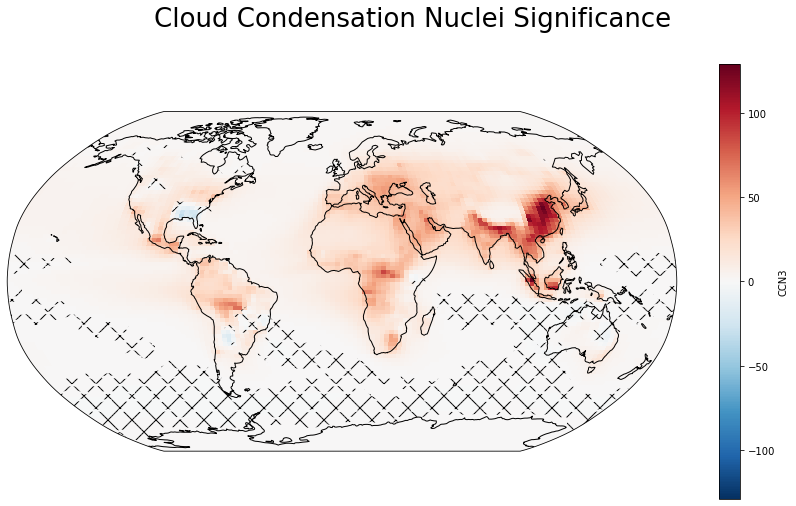

In [449]:
# Overlaying this on results means we just have to drop the hexbin alpha to zero as not to interfere with our primary plot
sig_mask = sig_results.where(sig_results >= 0.05)

X, Y = np.meshgrid(sig_results.lon, sig_results.lat) 
f, ax = plt.subplots(1, 1, figsize=(15, 8), facecolor='w', subplot_kw={'projection': ccrs.Robinson()})
f.suptitle(f"Cloud Condensation Nuclei Significance", fontsize=26)

(s4_ccn_ds-s3_ccn_ds).mean(dim="time").plot(ax=ax, transform=ccrs.PlateCarree())
ax.hexbin(X.reshape(-1), Y.reshape(-1), sig_mask.data.reshape(-1), hatch='x', alpha=0, transform=ccrs.PlateCarree())
ax.coastlines()

--------------

## Test: Do my direct/indirect effects match up with the aerosol burden?

This will be the summation of: 
- So I dont know if these are relevant, but theres:
    - Aerosol burden mode 1 __(BURDEN1)__
    - Aerosol burden mode 2 __(BURDEN2)__
    - Aerosol burden mode 3 __(BURDEN3)__
- Black carbon aerosol burden __(BURDENBC)__
- Dust aerosol burden __(BURDENDUST)__
- POM aerosol burden __(BURDENPOM)__
- Seasalt aerosol burden __(BURDENSEASALT)__
- Sulfate aerosol burden __(BURDENS04)__
- SOA aerosol burden __(BURDENSOA)__

But Im really only going to be focusing on __BURDENBC__ and __BURDENS04__ since those are the main anthropogenic aerosols.

In [450]:
S3_BURDENBC = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/BURDENBC.F_2000_CAM5_1850aero.mon.001-60.nc')
S4_BURDENBC = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/BURDENBC.F_2000_CAM5_good.mon.001-60.nc')

In [451]:
S3_BURDENBC.BURDENBC

<xarray.DataArray 'BURDENBC' (time: 720, lat: 96, lon: 144)>
[9953280 values with dtype=float32]
Coordinates:
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lon      (lon) float64 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
  * time     (time) object 0001-02-01 00:00:00 ... 0061-01-01 00:00:00
Attributes:
    units:         kg/m2
    long_name:     Black carbon aerosol burden
    cell_methods:  time: mean

In [452]:
BURDENBC_diff = (S4_BURDENBC.BURDENBC.isel(time=slice(467,720)).mean('time', keep_attrs=True)
              - S3_BURDENBC.BURDENBC.isel(time=slice(467,720)).mean('time', keep_attrs=True))

In [453]:
S3_BURDENSO4 = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/BURDENSO4.F_2000_CAM5_1850aero.mon.001-60.nc')
S4_BURDENSO4 = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/BURDENSO4.F_2000_CAM5_good.mon.001-60.nc')

In [454]:
S3_BURDENSO4.BURDENSO4

<xarray.DataArray 'BURDENSO4' (time: 720, lat: 96, lon: 144)>
[9953280 values with dtype=float32]
Coordinates:
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lon      (lon) float64 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
  * time     (time) object 0001-02-01 00:00:00 ... 0061-01-01 00:00:00
Attributes:
    units:         kg/m2
    long_name:     Sulfate aerosol burden
    cell_methods:  time: mean

In [455]:
BURDENSO4_diff = (S4_BURDENSO4.BURDENSO4.isel(time=slice(467,720)).mean('time', keep_attrs=True)
              - S3_BURDENSO4.BURDENSO4.isel(time=slice(467,720)).mean('time', keep_attrs=True))

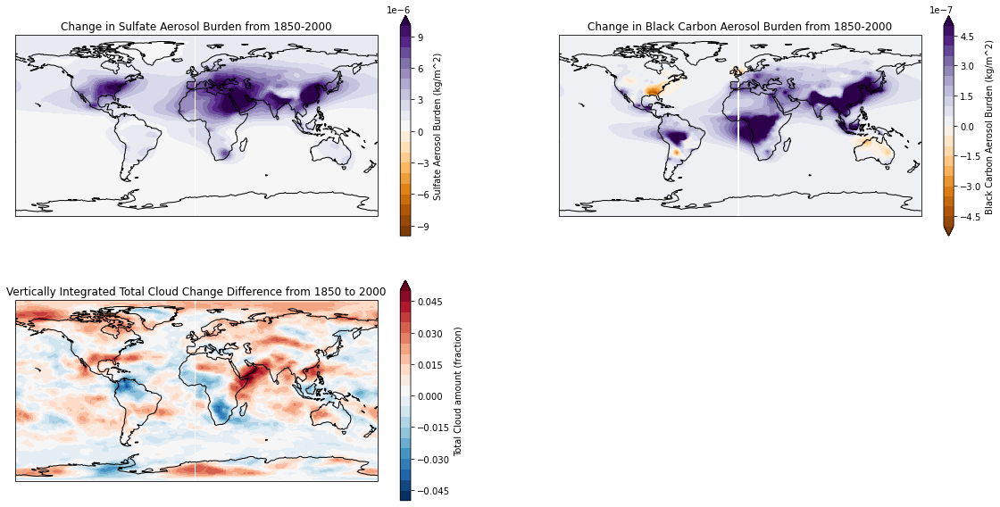

In [456]:
fig = plt.figure(figsize=[20,10])
ax = fig.add_subplot(221,projection=ccrs.PlateCarree())
BURDENSO4_diff.plot.contourf(ax=ax,levels=np.linspace(-0.00001,0.00001,21),cmap='PuOr',\
                                                                      cbar_kwargs={'label':'Sulfate Aerosol Burden (kg/m^2)'})
ax.coastlines()
ax.set_title('Change in Sulfate Aerosol Burden from 1850-2000')

ax2 = fig.add_subplot(222,projection=ccrs.PlateCarree())
BURDENBC_diff.plot.contourf(ax=ax2,levels=np.linspace(-0.0000005,0.0000005,21),cmap='PuOr',\
                                                                      cbar_kwargs={'label':'Black Carbon Aerosol Burden (kg/m^2)'})
ax2.coastlines()
ax2.set_title('Change in Black Carbon Aerosol Burden from 1850-2000')

ax4 = fig.add_subplot(223,projection=ccrs.PlateCarree())
CLDTOT_diff.plot.contourf(ax=ax4,levels=np.linspace(-0.05,0.05,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Total Cloud amount (fraction)'})
ax4.coastlines()
ax4.set_title('Vertically Integrated Total Cloud Change Difference from 1850 to 2000')

plt.show();

Listen to recording again, but I expect the BC burden to be causing the India/SE Asia changes while the sulfate would be driving the increased Nd and L in the SE Asia regions.

In [457]:
S3_BURDENDUST = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/BURDENDUST.F_2000_CAM5_1850aero.mon.001-60.nc')
S4_BURDENDUST = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/BURDENDUST.F_2000_CAM5_good.mon.001-60.nc')

In [458]:
BURDENDUST_diff = (S4_BURDENDUST.BURDENDUST.isel(time=slice(467,720)).mean('time', keep_attrs=True)
              - S3_BURDENDUST.BURDENDUST.isel(time=slice(467,720)).mean('time', keep_attrs=True))

In [459]:
S3_BURDENPOM = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/BURDENPOM.F_2000_CAM5_1850aero.mon.001-60.nc')
S4_BURDENPOM = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/BURDENPOM.F_2000_CAM5_good.mon.001-60.nc')

In [460]:
BURDENPOM_diff = (S4_BURDENPOM.BURDENPOM.isel(time=slice(467,720)).mean('time', keep_attrs=True)
              - S3_BURDENPOM.BURDENPOM.isel(time=slice(467,720)).mean('time', keep_attrs=True))

In [461]:
S3_BURDENSEASALT = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/BURDENSEASALT.F_2000_CAM5_1850aero.mon.001-60.nc')
S4_BURDENSEASALT = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/BURDENSEASALT.F_2000_CAM5_good.mon.001-60.nc')

In [462]:
BURDENSEASALT_diff = (S4_BURDENSEASALT.BURDENSEASALT.isel(time=slice(467,720)).mean('time', keep_attrs=True)
              - S3_BURDENSEASALT.BURDENSEASALT.isel(time=slice(467,720)).mean('time', keep_attrs=True))

In [463]:
S3_BURDENSOA = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/BURDENSOA.F_2000_CAM5_1850aero.mon.001-60.nc')
S4_BURDENSOA = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/BURDENSOA.F_2000_CAM5_good.mon.001-60.nc')

In [464]:
BURDENSOA_diff = (S4_BURDENSOA.BURDENSOA.isel(time=slice(467,720)).mean('time', keep_attrs=True)
              - S3_BURDENSOA.BURDENSOA.isel(time=slice(467,720)).mean('time', keep_attrs=True))

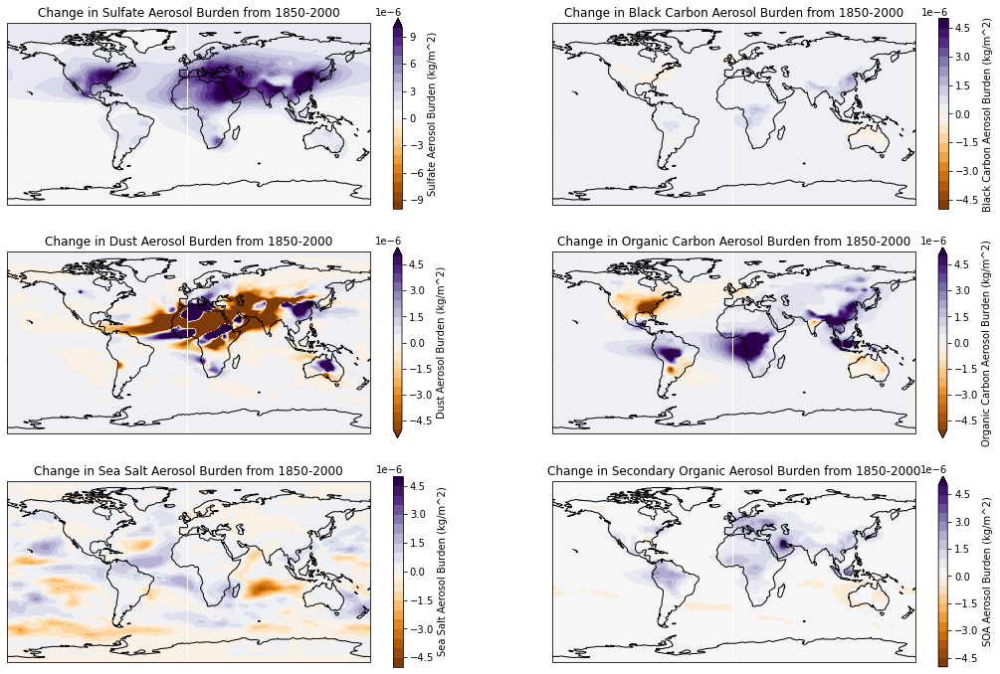

In [465]:
fig = plt.figure(figsize=[18,12])
ax = fig.add_subplot(321,projection=ccrs.PlateCarree())
BURDENSO4_diff.plot.contourf(ax=ax,levels=np.linspace(-0.00001,0.00001,21),cmap='PuOr',\
                                                                      cbar_kwargs={'label':'Sulfate Aerosol Burden (kg/m^2)'})
ax.coastlines()
ax.set_title('Change in Sulfate Aerosol Burden from 1850-2000')

ax2 = fig.add_subplot(322,projection=ccrs.PlateCarree())
BURDENBC_diff.plot.contourf(ax=ax2,levels=np.linspace(-0.000005,0.000005,21),cmap='PuOr',\
                                                                      cbar_kwargs={'label':'Black Carbon Aerosol Burden (kg/m^2)'})
ax2.coastlines()
ax2.set_title('Change in Black Carbon Aerosol Burden from 1850-2000')

ax3 = fig.add_subplot(323,projection=ccrs.PlateCarree())
BURDENDUST_diff.plot.contourf(ax=ax3,levels=np.linspace(-0.000005,0.000005,21),cmap='PuOr',\
                                                                      cbar_kwargs={'label':'Dust Aerosol Burden (kg/m^2)'})
ax3.coastlines()
ax3.set_title('Change in Dust Aerosol Burden from 1850-2000')

ax4 = fig.add_subplot(324,projection=ccrs.PlateCarree())
BURDENPOM_diff.plot.contourf(ax=ax4,levels=np.linspace(-0.000005,0.000005,21),cmap='PuOr',\
                                                                      cbar_kwargs={'label':'Organic Carbon Aerosol Burden (kg/m^2)'})
ax4.coastlines()
ax4.set_title('Change in Organic Carbon Aerosol Burden from 1850-2000')

ax5 = fig.add_subplot(325,projection=ccrs.PlateCarree())
BURDENSEASALT_diff.plot.contourf(ax=ax5,levels=np.linspace(-0.000005,0.000005,21),cmap='PuOr',\
                                                                      cbar_kwargs={'label':'Sea Salt Aerosol Burden (kg/m^2)'})
ax5.coastlines()
ax5.set_title('Change in Sea Salt Aerosol Burden from 1850-2000')

ax6 = fig.add_subplot(326,projection=ccrs.PlateCarree())
BURDENSOA_diff.plot.contourf(ax=ax6,levels=np.linspace(-0.000005,0.000005,21),cmap='PuOr',\
                                                                      cbar_kwargs={'label':'SOA Aerosol Burden (kg/m^2)'})
ax6.coastlines()
ax6.set_title('Change in Secondary Organic Aerosol Burden from 1850-2000')

plt.show();

I think I wait and check all of this with CESM2. Im not sure why some of these spatial patterns arent more clear. 
- Sulfate: Sulfate acts as good CCN so I would thin kthat this map would correlate with my cloud droplet concentration increase and it sort of does, but theres is a lot that doesnt match up. Furthermore, this was expected to be the main driving aeroosl behind the negative indirect ERF and its not really explaining that either.
- Black Carbon: Black Carbon is an absorbing aerosols so I expected to see some warming from the direct ERF in the areas where I have increases BC. This is true for over India, but it does not explain the changes over China and SE Asia


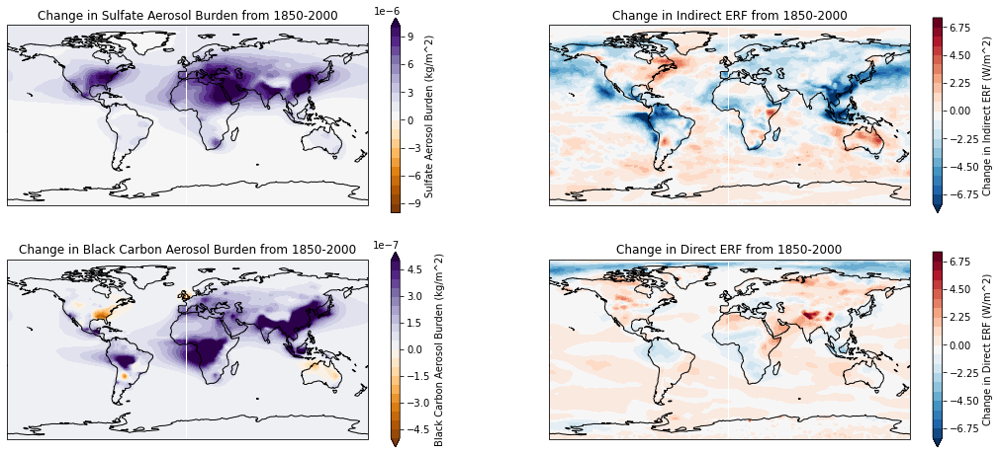

In [466]:
fig = plt.figure(figsize=[18,8])
ax = fig.add_subplot(221,projection=ccrs.PlateCarree())
BURDENSO4_diff.plot.contourf(ax=ax,levels=np.linspace(-0.00001,0.00001,21),cmap='PuOr',\
                                                                      cbar_kwargs={'label':'Sulfate Aerosol Burden (kg/m^2)'})
ax.coastlines()
ax.set_title('Change in Sulfate Aerosol Burden from 1850-2000')

ax2 = fig.add_subplot(222,projection=ccrs.PlateCarree())
indirect_ERF.plot.contourf(ax=ax2,levels=np.linspace(-7.5,7.5,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Change in Indirect ERF (W/m^2)'})
ax2.coastlines()
ax2.set_title('Change in Indirect ERF from 1850-2000')

ax3 = fig.add_subplot(223,projection=ccrs.PlateCarree())
BURDENBC_diff.plot.contourf(ax=ax3,levels=np.linspace(-0.0000005,0.0000005,21),cmap='PuOr',\
                                                                      cbar_kwargs={'label':'Black Carbon Aerosol Burden (kg/m^2)'})
ax3.coastlines()
ax3.set_title('Change in Black Carbon Aerosol Burden from 1850-2000')

ax4 = fig.add_subplot(224,projection=ccrs.PlateCarree())
direct_ERF.plot.contourf(ax=ax4,levels=np.linspace(-7.5,7.5,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Change in Direct ERF (W/m^2)'})
ax4.coastlines()
ax4.set_title('Change in Direct ERF from 1850-2000')

plt.show();

-----------------


__LHFLX__ (Surface latent heat flux)
__SHFLX__ (Surface sensible heat flux)
__OMEGA__ (Vertical velocity (pressure))
__PS__ (Surface pressure)


Humidity, vertical ascent? upward mass flux?

Nd = 50 cm^-3 and WTG parameterization:
- larger Nd increases large scale ascent? accompanied by increases in upward mass flux in clouds?
- high percentile vertical velocities increase with Nd. the increase in high percentile vertical velocities is linked to increases in frequency, not of increased speed of strong updrafts.
- Larger cloud mass fluxes and high percentile vertical velocities are signatures of convective invigoration

Removed WTG parameterization and varied Nd:
- increasing Nd no longer leads to large changes in cloud mass fluxes or high percentile vertical velocities. 
- Instead, heating that would trigger large scale ascent under WTG instead leads to increased atmospheric temperatures. 

-------------------

# Thermodynamical processes: 
- __(T)__ Atmospheric temperature
- __(Q)__ Specific humidity
- __(PS)__ Surface pressure
- __(RELHUM)__ Relative humidity
- __(CLOUD)__ Cloud fraction
- (If __RELHUM__ > 1) Supersaturation
- Static stability, calculated with xarray
- __(OMEGA)__ Vertical Velocity
- __(CAPE)__ I dont have right now boooo..
- __(LHFLX)__ Latent heat flux
- __(SHFLX)__ Sensible heat flux

In [5]:
S3_CLOUD = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/CLOUD.F_2000_CAM5_1850aero.mon.001-60.nc')
S4_CLOUD = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/CLOUD.F_2000_CAM5_good.mon.001-60.nc')

In [468]:
s3_temp = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/T.F_2000_CAM5_1850aero.mon.001-60.nc')
s4_temp = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/T.F_2000_CAM5_good.mon.001-60.nc')

s3_shum = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/Q.F_2000_CAM5_1850aero.mon.001-60.nc')
s4_shum = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/Q.F_2000_CAM5_good.mon.001-60.nc')

s3_pres = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/PS.F_2000_CAM5_1850aero.mon.001-60.nc')
s4_pres = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/PS.F_2000_CAM5_good.mon.001-60.nc')

s3_relhum = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/RELHUM.F_2000_CAM5_1850aero.mon.001-60.nc')
s4_relhum = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/RELHUM.F_2000_CAM5_good.mon.001-60.nc')

In [469]:
cloud_diff = (S4_CLOUD.CLOUD.isel(time=slice(467,720)).mean('time', keep_attrs=True)
              - S3_CLOUD.CLOUD.isel(time=slice(467,720)).mean('time', keep_attrs=True))

In [470]:
temp_diff = (s4_temp.T.isel(time=slice(467,720)).mean('time', keep_attrs=True)
              - s3_temp.T.isel(time=slice(467,720)).mean('time', keep_attrs=True))

In [471]:
s4_temp.T

<xarray.DataArray 'T' (time: 720, lev: 30, lat: 96, lon: 144)>
[298598400 values with dtype=float32]
Coordinates:
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lev      (lev) float64 3.643 7.595 14.36 24.61 ... 936.2 957.5 976.3 992.6
  * lon      (lon) float64 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
  * time     (time) object 0001-02-01 00:00:00 ... 0061-01-01 00:00:00
Attributes:
    mdims:         1
    units:         K
    long_name:     Temperature
    cell_methods:  time: mean

In [472]:
shum_diff = (s4_shum.Q.isel(time=slice(467,720)).mean('time', keep_attrs=True)
              - s3_shum.Q.isel(time=slice(467,720)).mean('time', keep_attrs=True))

In [473]:
pres_diff = (s4_pres.PS.isel(time=slice(467,720)).mean('time', keep_attrs=True)
              - s3_pres.PS.isel(time=slice(467,720)).mean('time', keep_attrs=True))

In [474]:
relhum_diff = (s4_relhum.RELHUM.isel(time=slice(467,720)).mean('time', keep_attrs=True)
              - s3_relhum.RELHUM.isel(time=slice(467,720)).mean('time', keep_attrs=True))

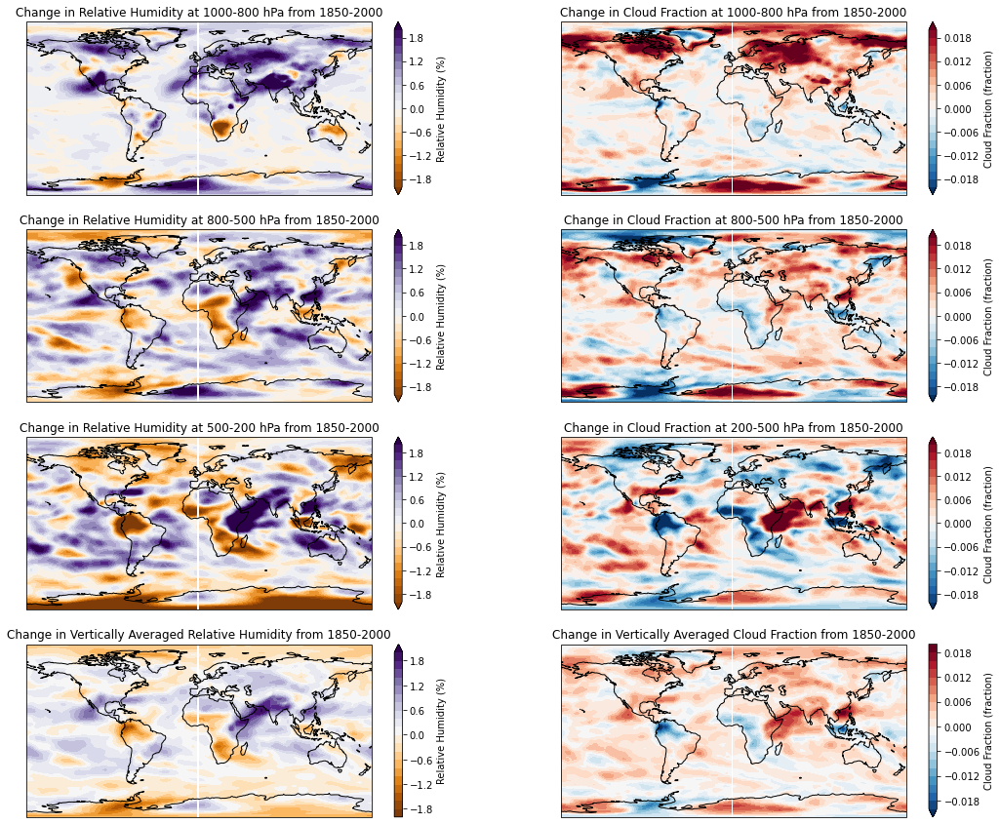

In [475]:
fig = plt.figure(figsize=[18,15])
ax = fig.add_subplot(421,projection=ccrs.PlateCarree())
relhum_diff.sel(lev=slice(800,1000)).mean('lev').plot.contourf(ax=ax,levels=np.linspace(-2,2,21),cmap='PuOr',\
                                                                      cbar_kwargs={'label':'Relative Humidity (%)'})
ax.coastlines()
ax.set_title('Change in Relative Humidity at 1000-800 hPa from 1850-2000')

ax2 = fig.add_subplot(422,projection=ccrs.PlateCarree())
cloud_diff.sel(lev=slice(800,1000)).mean('lev').plot.contourf(ax=ax2,levels=np.linspace(-0.02,0.02,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Cloud Fraction (fraction)'})
ax2.coastlines()
ax2.set_title('Change in Cloud Fraction at 1000-800 hPa from 1850-2000')

ax3 = fig.add_subplot(423,projection=ccrs.PlateCarree())
relhum_diff.sel(lev=slice(500,800)).mean('lev').plot.contourf(ax=ax3,levels=np.linspace(-2,2,21),cmap='PuOr',\
                                                                      cbar_kwargs={'label':'Relative Humidity (%)'})
ax3.coastlines()
ax3.set_title('Change in Relative Humidity at 800-500 hPa from 1850-2000')

ax4 = fig.add_subplot(424,projection=ccrs.PlateCarree())
cloud_diff.sel(lev=slice(500,800)).mean('lev').plot.contourf(ax=ax4,levels=np.linspace(-0.02,0.02,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Cloud Fraction (fraction)'})
ax4.coastlines()
ax4.set_title('Change in Cloud Fraction at 800-500 hPa from 1850-2000')

ax5 = fig.add_subplot(425,projection=ccrs.PlateCarree())
relhum_diff.sel(lev=slice(200,500)).mean('lev').plot.contourf(ax=ax5,levels=np.linspace(-2,2,21),cmap='PuOr',\
                                                                      cbar_kwargs={'label':'Relative Humidity (%)'})
ax5.coastlines()
ax5.set_title('Change in Relative Humidity at 500-200 hPa from 1850-2000')

ax6 = fig.add_subplot(426,projection=ccrs.PlateCarree())
cloud_diff.sel(lev=slice(200,500)).mean('lev').plot.contourf(ax=ax6,levels=np.linspace(-0.02,0.02,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Cloud Fraction (fraction)'})
ax6.coastlines()
ax6.set_title('Change in Cloud Fraction at 200-500 hPa from 1850-2000')

ax7 = fig.add_subplot(427,projection=ccrs.PlateCarree())
relhum_diff.mean('lev').plot.contourf(ax=ax7,levels=np.linspace(-2,2,21),cmap='PuOr',\
                                                                      cbar_kwargs={'label':'Relative Humidity (%)'})
ax7.coastlines()
ax7.set_title('Change in Vertically Averaged Relative Humidity from 1850-2000')

ax8 = fig.add_subplot(428,projection=ccrs.PlateCarree())
cloud_diff.mean('lev').plot.contourf(ax=ax8,levels=np.linspace(-0.02,0.02,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Cloud Fraction (fraction)'})
ax8.coastlines()
ax8.set_title('Change in Vertically Averaged Cloud Fraction from 1850-2000')

plt.show();

These correlate pretty well! 
There are larger increases in relative humidity the lower in the atmosphere you are. These large increases could be from... Well, ill have to start looking at all of my other variables and figure this out. 


#### Supersaturation:

Parcels are considered supersaturated when the relative humidity is above 100%

In [476]:
# # #Create a variable to hold relative humidity averaged over 1000-800 hPa
# # relhum_low = relhum_diff.sel(lev=slice(800,1000)).mean('lev')

# #Create a supersaturation variable that filters the lower tropospheric relative humidity for values above 1
# supersaturation_high = relhum_diff.where(relhum_diff>1)
# supersaturation_low = relhum_diff.where(relhum_diff<-1)

    
# # supersaturation = supersaturation_high + supersaturation_low

In [477]:
# relhum_diff

In [478]:
# fig = plt.figure(figsize=[20,10])
# ax = fig.add_subplot(221,projection=ccrs.PlateCarree())
# supersaturation.sel(lev=slice(800,1000)).mean('lev').plot.contourf(ax=ax,levels=np.linspace(-2,2,21),cmap='RdBu_r',\
#                                                                       cbar_kwargs={'label':'Supersaturation (%)'})
# ax.coastlines()
# ax.set_title('Change in Supersaturation at 1000-800 hPa from 1850-2000')

# ax2 = fig.add_subplot(222,projection=ccrs.PlateCarree())
# supersaturation.sel(lev=slice(500,800)).mean('lev').plot.contourf(ax=ax2,levels=np.linspace(-2,2,21),cmap='RdBu_r',\
#                                                                       cbar_kwargs={'label':'Supersaturation (%)'})
# ax2.coastlines()
# ax2.set_title('Change in Supersaturation at 800-500 hPa from 1850-2000')

# ax3 = fig.add_subplot(223,projection=ccrs.PlateCarree())
# supersaturation.sel(lev=slice(200,500)).mean('lev').plot.contourf(ax=ax3,levels=np.linspace(-2,2,21),cmap='RdBu_r',\
#                                                                       cbar_kwargs={'label':'Supersaturation (%)'})
# ax3.coastlines()
# ax3.set_title('Change in Supersaturation at 500-200 hPa from 1850-2000')

# ax4 = fig.add_subplot(224,projection=ccrs.PlateCarree())
# supersaturation.mean('lev').plot.contourf(ax=ax4,levels=np.linspace(-2,2,21),cmap='RdBu_r',\
#                                                                       cbar_kwargs={'label':'Supersaturation (%)'})
# ax4.coastlines()
# ax4.set_title('Change in Vertically Averaged Supersaturation from 1850-2000')

# plt.show();

There actually isn't supersaturation anywhere! However, we're averaging over several atmospheric layers and over a few hours. Clouds are tremendously dynamic and supersaturation is often highly localized. By averaging relative humidity over both space and time, we're likely averaging away the instances of supersaturation.

#### Atmospheric Stability:
Atmospheric Stability is defined by whether the environmental lapse rate ($\Gamma_E$) is greater or less than the dry adiabatic lapse rate ($\Gamma_D$) or the moist adiabatic lapse rate ($\Gamma_S$).

**Task 2a: Complete the list below** with the condition that is true for an absolutely stable and an absolutely unstable atmosphere. (Hint: look back at your notes from Atmospheric Thermodynamics.)
* Absolutely stable atmosphere: $\Gamma_E$ < $\Gamma_S$ < $\Gamma_D$
* Absolutely unstable atmosphere: $\Gamma_S$ < $\Gamma_D$ < $\Gamma_E$
* Conditionally unstable atmosphere: $\Gamma_S$ < $\Gamma_E$ < $\Gamma_D$

MetPy has a built in function to calculate a term called "static stability," $\sigma$. Static stability is defined as: $\sigma = \frac{dT_{atmos}}{dz}+\frac{g}{c_p}$, where $T_{atmos}$ is the atmospheric temperature, $g$ is the gravitational constant (9.81 m/s^2), and $c_p $ is the specific heat of water at constant pressure (1004 J/kgK). Which will give me in units K/m. Translate to C/km.

Atmospheric stabilility is basically, what is the parcels temperature relative to the atmosphere around it? The __moist adiabatic lapse rate is ~4.5 C/km__ and the __dry adiabatic lapse rate is ~9.8 C/km__ where the __environmental lapse rate is ~6.5 C/km.__ But the environmental lapse rate can change and that will determine whether parcels are stable or unstable and it will also depend on how saturated the parcel is.

If a parcel has a larger lapse rate than the environment, then that means as you lift or descend the parcel, it will cool (lift) or heat (descend) faster than the environment and it will be __stable__. When it is lifted, it will be colder and denser than the environment and it will sink back down, and if it is pushed down, it will be warmer and less dense than the environment and it will rise. 

But if the environment has a larger lapse rate than the parcel, then this results in an __unstable__ case. Because when a parcel is lifted or pushed down, it does not change temeprature as quickly as the environment so if it is lifted, it is warmer than the environment so it will rise. And if it is pushed down, it is cooler than the environment so it will sink. 

Furthermore, the amount of saturation in a parcel is important because as a parcel cools, it becomes more saturated, and when it reaches the point of saturation and the water starts to condense, latent heat is released which partially offsets the cooling of rising (or falling). Therefore the moist adiabatic lapse rate is lower than the dry adiabatic lapse rate.

So a parcel will rise along the dry adiabatic lapse rate until it reaches saturation, then it rises along the moist adiabatic lapse rate and slows down. The lifting condensation level is where this switch happens. 

So, __if the environmental lapse rate is greater__ than both the moist adiabatic lapse rate and the dry adiabatic lapse rate, it is a __absolutely unstable atmosphere__ meaning that whether the parcel is dry or moist, it is unstable. __If the environmetal lapse rate is lower__ than the moist and dry adiabatic lapse rates, then the environment is __absolutely stable__, meaning that whether the parcel is dry or moist, it is stable. But __if the environmental lapse rate is between__ the moist and dry adiabatic lapse rates, then the atmosphere is __conditionally unstable__ and it depends on if the parcel is moist or dry to determine if the parcel will be stable or unstable. __Stable for dry and unstable for moist.__

http://pressbooks-dev.oer.hawaii.edu/atmo/chapter/chapter-5-atmospheric-stability/

In [479]:
temp_diff.lev.attrs['units'] = 'hPa'

In [480]:
temp_diff.attrs['units'] = 'K'

In [481]:
# temp_diff

In [482]:
# statstab = (temp_diff / temp_diff.lev) + (6.67e-11 / 4.186)

In [483]:
import metpy.calc as mpcalc

stat_stab = mpcalc.static_stability(temp_diff.lev, temp_diff)

/projects/dgs/rh5_local/anaconda/climate/lib/python3.8/site-packages/metpy/calc/thermo.py:3001: RuntimeWarning: divide by zero encountered in log
  np.log(theta.m_as('K')),
/projects/dgs/rh5_local/anaconda/climate/lib/python3.8/site-packages/metpy/calc/thermo.py:3001: RuntimeWarning: invalid value encountered in log
  np.log(theta.m_as('K')),
/projects/dgs/rh5_local/anaconda/climate/lib/python3.8/site-packages/pint/quantity.py:1238: RuntimeWarning: invalid value encountered in multiply
  magnitude = magnitude_op(new_self._magnitude, other._magnitude)


In [484]:
# statstab

/projects/dgs/rh5_local/anaconda/climate/lib/python3.8/site-packages/numpy/core/fromnumeric.py:87: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/projects/dgs/rh5_local/anaconda/climate/lib/python3.8/site-packages/numpy/core/fromnumeric.py:87: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/projects/dgs/rh5_local/anaconda/climate/lib/python3.8/site-packages/numpy/core/fromnumeric.py:87: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


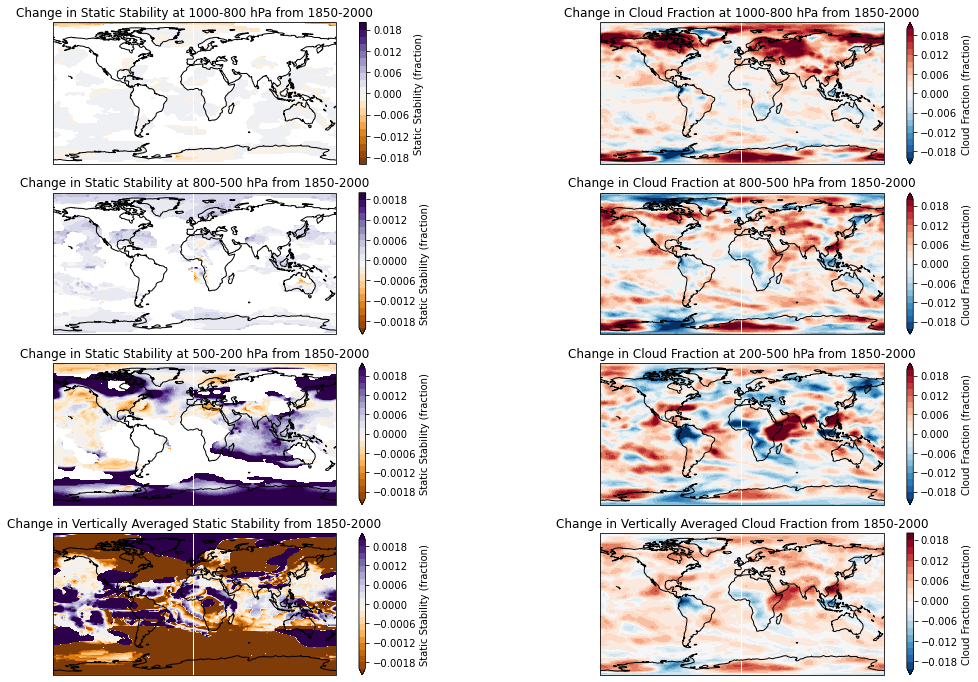

In [485]:
fig = plt.figure(figsize=[18,12])
ax = fig.add_subplot(421,projection=ccrs.PlateCarree())
stat_stab.sel(lev=slice(800,1000)).mean('lev').plot.contourf(ax=ax,levels=np.linspace(-0.02,0.02,21),cmap='PuOr',\
                                                                      cbar_kwargs={'label':'Static Stability (fraction)'})
ax.coastlines()
ax.set_title('Change in Static Stability at 1000-800 hPa from 1850-2000')

ax2 = fig.add_subplot(422,projection=ccrs.PlateCarree())
cloud_diff.sel(lev=slice(800,1000)).mean('lev').plot.contourf(ax=ax2,levels=np.linspace(-0.02,0.02,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Cloud Fraction (fraction)'})
ax2.coastlines()
ax2.set_title('Change in Cloud Fraction at 1000-800 hPa from 1850-2000')

ax3 = fig.add_subplot(423,projection=ccrs.PlateCarree())
stat_stab.sel(lev=slice(500,800)).mean('lev').plot.contourf(ax=ax3,levels=np.linspace(-0.002,0.002,21),cmap='PuOr',\
                                                                      cbar_kwargs={'label':'Static Stability (fraction)'})
ax3.coastlines()
ax3.set_title('Change in Static Stability at 800-500 hPa from 1850-2000')

ax4 = fig.add_subplot(424,projection=ccrs.PlateCarree())
cloud_diff.sel(lev=slice(500,800)).mean('lev').plot.contourf(ax=ax4,levels=np.linspace(-0.02,0.02,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Cloud Fraction (fraction)'})
ax4.coastlines()
ax4.set_title('Change in Cloud Fraction at 800-500 hPa from 1850-2000')

ax5 = fig.add_subplot(425,projection=ccrs.PlateCarree())
stat_stab.sel(lev=slice(200,500)).mean('lev').plot.contourf(ax=ax5,levels=np.linspace(-0.002,0.002,21),cmap='PuOr',\
                                                                      cbar_kwargs={'label':'Static Stability (fraction)'})
ax5.coastlines()
ax5.set_title('Change in Static Stability at 500-200 hPa from 1850-2000')

ax6 = fig.add_subplot(426,projection=ccrs.PlateCarree())
cloud_diff.sel(lev=slice(200,500)).mean('lev').plot.contourf(ax=ax6,levels=np.linspace(-0.02,0.02,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Cloud Fraction (fraction)'})
ax6.coastlines()
ax6.set_title('Change in Cloud Fraction at 200-500 hPa from 1850-2000')

ax7 = fig.add_subplot(427,projection=ccrs.PlateCarree())
stat_stab.mean('lev').plot.contourf(ax=ax7,levels=np.linspace(-0.002,0.002,21),cmap='PuOr',\
                                                                      cbar_kwargs={'label':'Static Stability (fraction)'})
ax7.coastlines()
ax7.set_title('Change in Vertically Averaged Static Stability from 1850-2000')

ax8 = fig.add_subplot(428,projection=ccrs.PlateCarree())
cloud_diff.mean('lev').plot.contourf(ax=ax8,levels=np.linspace(-0.02,0.02,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Cloud Fraction (fraction)'})
ax8.coastlines()
ax8.set_title('Change in Vertically Averaged Cloud Fraction from 1850-2000')

plt.show();

Positive values mean the atmosphere is stable to vertical motion and that the dry and moist adiabatic lapse rates are greater than the environmental lapse rate. In areas where there are negative values, this means that the atmopshere is unstable and susceptible to vertical motion which could lead to cloud formation. 
But there might be areas where there is a static atmosphere, but have cloud formations. This will probably mean that something else is driving these formations. 

Why are my units so large, did I calculate this correctly?

In [486]:
s3_z = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/Z3.F_2000_CAM5_1850aero.mon.001-60.nc')
s4_z = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/Z3.F_2000_CAM5_good.mon.001-60.nc')

In [487]:
# s3_z.Z3

In [488]:
geopot_diff = (s4_z.Z3.isel(time=slice(467,720)).mean('time', keep_attrs=True)
              - s3_z.Z3.isel(time=slice(467,720)).mean('time', keep_attrs=True))

In [489]:
# geopot_diff

In [490]:
statstab = (temp_diff / geopot_diff) + (9.81 / 1004)

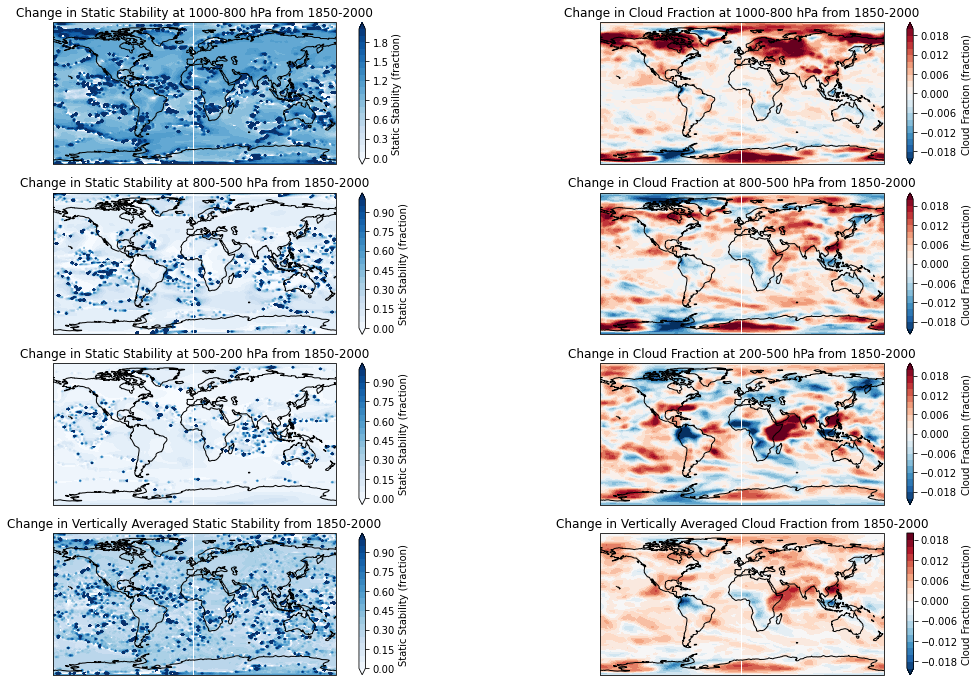

In [491]:
fig = plt.figure(figsize=[18,12])
ax = fig.add_subplot(421,projection=ccrs.PlateCarree())
statstab.sel(lev=slice(800,1000)).mean('lev').plot.contourf(ax=ax,levels=np.linspace(0,2,21),cmap='Blues',\
                                                                      cbar_kwargs={'label':'Static Stability (fraction)'})
ax.coastlines()
ax.set_title('Change in Static Stability at 1000-800 hPa from 1850-2000')

ax2 = fig.add_subplot(422,projection=ccrs.PlateCarree())
cloud_diff.sel(lev=slice(800,1000)).mean('lev').plot.contourf(ax=ax2,levels=np.linspace(-0.02,0.02,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Cloud Fraction (fraction)'})
ax2.coastlines()
ax2.set_title('Change in Cloud Fraction at 1000-800 hPa from 1850-2000')

ax3 = fig.add_subplot(423,projection=ccrs.PlateCarree())
statstab.sel(lev=slice(500,800)).mean('lev').plot.contourf(ax=ax3,levels=np.linspace(0,1,21),cmap='Blues',\
                                                                      cbar_kwargs={'label':'Static Stability (fraction)'})
ax3.coastlines()
ax3.set_title('Change in Static Stability at 800-500 hPa from 1850-2000')

ax4 = fig.add_subplot(424,projection=ccrs.PlateCarree())
cloud_diff.sel(lev=slice(500,800)).mean('lev').plot.contourf(ax=ax4,levels=np.linspace(-0.02,0.02,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Cloud Fraction (fraction)'})
ax4.coastlines()
ax4.set_title('Change in Cloud Fraction at 800-500 hPa from 1850-2000')

ax5 = fig.add_subplot(425,projection=ccrs.PlateCarree())
statstab.sel(lev=slice(200,500)).mean('lev').plot.contourf(ax=ax5,levels=np.linspace(0,1,21),cmap='Blues',\
                                                                      cbar_kwargs={'label':'Static Stability (fraction)'})
ax5.coastlines()
ax5.set_title('Change in Static Stability at 500-200 hPa from 1850-2000')

ax6 = fig.add_subplot(426,projection=ccrs.PlateCarree())
cloud_diff.sel(lev=slice(200,500)).mean('lev').plot.contourf(ax=ax6,levels=np.linspace(-0.02,0.02,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Cloud Fraction (fraction)'})
ax6.coastlines()
ax6.set_title('Change in Cloud Fraction at 200-500 hPa from 1850-2000')

ax7 = fig.add_subplot(427,projection=ccrs.PlateCarree())
statstab.mean('lev').plot.contourf(ax=ax7,levels=np.linspace(0,1,21),cmap='Blues',\
                                                                      cbar_kwargs={'label':'Static Stability (fraction)'})
ax7.coastlines()
ax7.set_title('Change in Vertically Averaged Static Stability from 1850-2000')

ax8 = fig.add_subplot(428,projection=ccrs.PlateCarree())
cloud_diff.mean('lev').plot.contourf(ax=ax8,levels=np.linspace(-0.02,0.02,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Cloud Fraction (fraction)'})
ax8.coastlines()
ax8.set_title('Change in Vertically Averaged Cloud Fraction from 1850-2000')

plt.show();

In [492]:
coslat = np.cos(np.deg2rad(s3_temp.lat))
weight = coslat/coslat.mean(dim='lat')

s3 = (s3_temp.T * weight).isel(time=slice(467,720)).mean('time', keep_attrs=True).mean(dim=('lat','lon'))

In [493]:
s4 = (s4_temp.T * weight).isel(time=slice(467,720)).mean('time', keep_attrs=True).mean(dim=('lat','lon'))

In [494]:
np.array_equiv(s3, s4)

False

In [495]:
diff = s4-s3

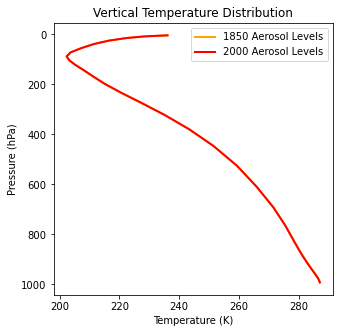

In [496]:
fig = plt.figure(figsize=(5,5))
s3.plot.line(y='lev', color='orange', linestyle='-', linewidth=2, label='1850 Aerosol Levels')
s4.plot.line(y='lev', color='red', linestyle='-', linewidth=2, label='2000 Aerosol Levels')
plt.gca().invert_yaxis()
plt.xlabel("Temperature (K)")
plt.ylabel('Pressure (hPa)')
plt.legend()
plt.title('Vertical Temperature Distribution')
plt.show()

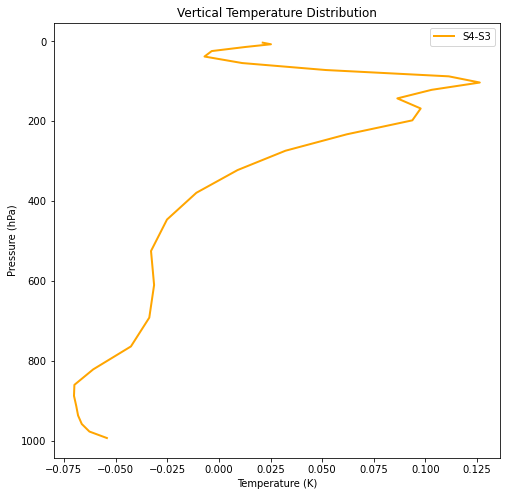

In [497]:
fig = plt.figure(figsize=(8,8))
diff.plot.line(y='lev', color='orange', linestyle='-', linewidth=2, label='S4-S3')
plt.gca().invert_yaxis()
plt.xlabel("Temperature (K)")
plt.ylabel('Pressure (hPa)')
plt.legend()
plt.title('Vertical Temperature Distribution')
plt.show()

### CAPE: Convective Available Potential Energy 
The amount of energy available for convection.
I dont have this variable right now. Essentially the maximum buyancy of a parcel

### Latent Heat Flux (LHFLX) and Sensible Heat Flux (SHFLX)
Reminder: __Latent heat flux__ is the energy exchanged from a surface to the atmosphere when water either condenses or evaporates. 
Latent heat is the heat of transformation (vaporization). This is the amount of energy that must be applied to a liquid to transform it into a gas. Latent heat of condensation is the same but opposite results. It is the energy released when it condenses. 
For every kg of water that evaporates, 2.5e6 J of energy is needed. For every kg of water that condenses, 2.5e6 J of energy is released.

__Sensible heat flux__ is the conductive heat flux. Changes in temperature NOT associated with phase change. Surfaces covered in water will have large latent heat fluxes while a desert surface will have no LH flux, but a large SH flux

Surfaces can be defined by their __Bowen Ratio__. 
- BR < 1 means a surface is moist and theres a lot of evaporation
- BR > 1 means a surface is dry and theres little evaporation

In [498]:
s3_lhflx = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/LHFLX.F_2000_CAM5_1850aero.mon.001-60.nc')
s4_lhflx = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/LHFLX.F_2000_CAM5_good.mon.001-60.nc')

s3_shflx = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/SHFLX.F_2000_CAM5_1850aero.mon.001-60.nc')
s4_shflx = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/SHFLX.F_2000_CAM5_good.mon.001-60.nc')

In [499]:
# s3_lhflx.LHFLX

In [500]:
lhflx_diff = (s4_lhflx.LHFLX.isel(time=slice(467,720)).mean('time', keep_attrs=True)
              - s3_lhflx.LHFLX.isel(time=slice(467,720)).mean('time', keep_attrs=True))

shflx_diff = (s4_shflx.SHFLX.isel(time=slice(467,720)).mean('time', keep_attrs=True)
              - s3_shflx.SHFLX.isel(time=slice(467,720)).mean('time', keep_attrs=True))

bowen = shflx_diff / lhflx_diff

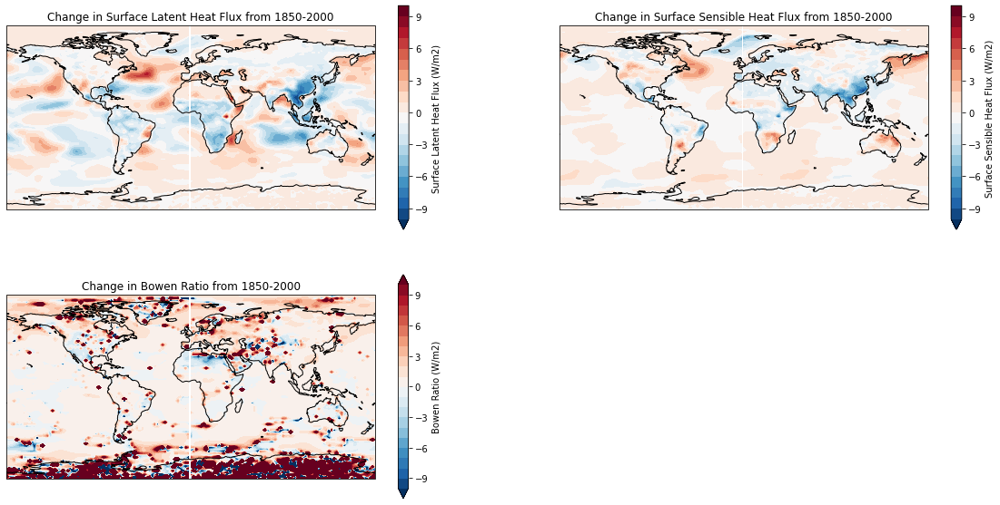

In [501]:
fig = plt.figure(figsize=[20,10])
ax = fig.add_subplot(221,projection=ccrs.PlateCarree())
lhflx_diff.plot.contourf(ax=ax,levels=np.linspace(-10,10,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Surface Latent Heat Flux (W/m2)'})
ax.coastlines()
ax.set_title('Change in Surface Latent Heat Flux from 1850-2000')

ax2 = fig.add_subplot(222,projection=ccrs.PlateCarree())
shflx_diff.plot.contourf(ax=ax2,levels=np.linspace(-10,10,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Surface Sensible Heat Flux (W/m2)'})
ax2.coastlines()
ax2.set_title('Change in Surface Sensible Heat Flux from 1850-2000')

ax3 = fig.add_subplot(223,projection=ccrs.PlateCarree())
bowen.plot.contourf(ax=ax3,levels=np.linspace(-10,10,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Bowen Ratio (W/m2)'})
ax3.coastlines()
ax3.set_title('Change in Bowen Ratio from 1850-2000')

plt.show();

I would expect to be getting a positive latent heat flux change ....

### Vertical Velocity (OMEGA)

In [502]:
s3_vert = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/OMEGA.F_2000_CAM5_1850aero.mon.001-60.nc')
s4_vert = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/OMEGA.F_2000_CAM5_good.mon.001-60.nc')

In [503]:
# s3_vert.OMEGA

In [504]:
vert_diff = (s4_vert.OMEGA.isel(time=slice(467,720)).mean('time', keep_attrs=True)
              - s3_vert.OMEGA.isel(time=slice(467,720)).mean('time', keep_attrs=True))

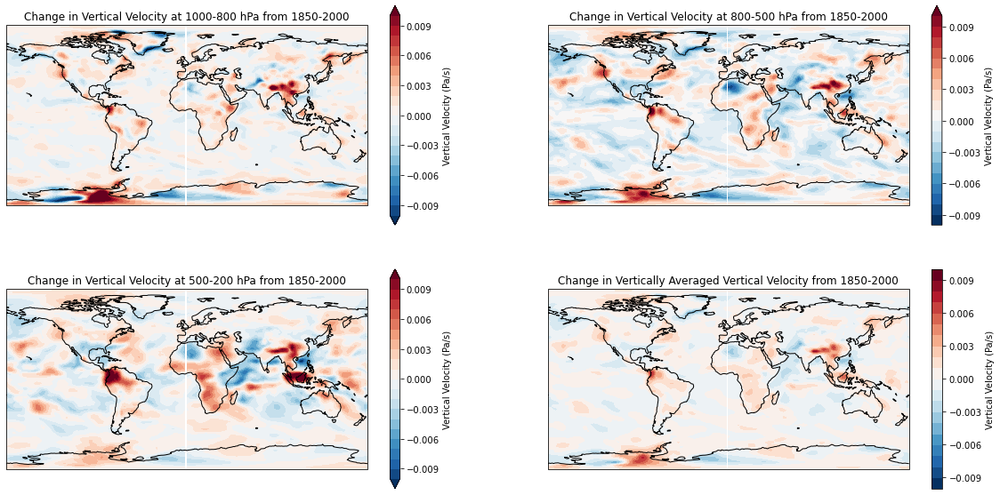

In [505]:
fig = plt.figure(figsize=[20,10])
ax = fig.add_subplot(221,projection=ccrs.PlateCarree())
vert_diff.sel(lev=slice(800,1000)).mean('lev').plot.contourf(ax=ax,levels=np.linspace(-0.01,0.01,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Vertical Velocity (Pa/s)'})
ax.coastlines()
ax.set_title('Change in Vertical Velocity at 1000-800 hPa from 1850-2000')

ax2 = fig.add_subplot(222,projection=ccrs.PlateCarree())
vert_diff.sel(lev=slice(500,800)).mean('lev').plot.contourf(ax=ax2,levels=np.linspace(-0.01,0.01,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Vertical Velocity (Pa/s)'})
ax2.coastlines()
ax2.set_title('Change in Vertical Velocity at 800-500 hPa from 1850-2000')

ax3 = fig.add_subplot(223,projection=ccrs.PlateCarree())
vert_diff.sel(lev=slice(200,500)).mean('lev').plot.contourf(ax=ax3,levels=np.linspace(-0.01,0.01,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Vertical Velocity (Pa/s)'})
ax3.coastlines()
ax3.set_title('Change in Vertical Velocity at 500-200 hPa from 1850-2000')

ax4 = fig.add_subplot(224,projection=ccrs.PlateCarree())
vert_diff.mean('lev').plot.contourf(ax=ax4,levels=np.linspace(-0.01,0.01,21),cmap='RdBu_r',\
                                                                      cbar_kwargs={'label':'Vertical Velocity (Pa/s)'})
ax4.coastlines()
ax4.set_title('Change in Vertically Averaged Vertical Velocity from 1850-2000')

plt.show();

# 4: Dynamical Changes: ---------------------------------------------------

- Global circulation?
- Temperature?
- Geostrophic Balance?
- Cyclones/Anticyclones?
- Frontal Modification?
- Walker circulation
- ENSO

-----------------

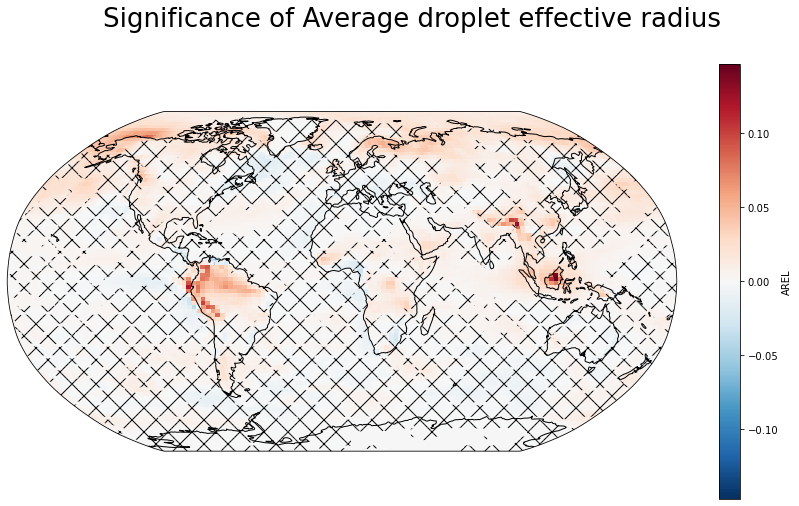

In [4]:
S3_AREL = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_1850aero/atm/hist/AREL.F_2000_CAM5_1850aero.mon.001-60.nc')
S4_AREL = xr.open_dataset('/projects/dgs/persad_research/F_2000_CAM5_good/atm/hist/AREL.F_2000_CAM5_good.mon.001-60.nc')

uncertainty_3d(S4_AREL.AREL, S3_AREL.AREL)

In [8]:
S4_AREL

NameError: name 'S4_AREL' is not defined

In [536]:
uncertainty_2d(S4_CLDHGH.CLDHGH, S3_CLDHGH.CLDHGH)

NameError: name 's4_ccn_ds' is not defined